### Set up

In [2]:
pip install darts

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import darts
from darts import TimeSeries
from darts.utils.timeseries_generation import (
    gaussian_timeseries,
    linear_timeseries,
    sine_timeseries,
)

from darts.metrics import mape, smape, mae
from darts.dataprocessing.transformers import Scaler
from darts.utils.timeseries_generation import datetime_attribute_timeseries

from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import RandomForestRegressor

from darts.models import LightGBMModel

from darts.models import LightGBMModel, RandomForest, LinearRegressionModel
from darts.utils.statistics import check_seasonality, plot_acf, plot_residuals_analysis

from darts.explainability.shap_explainer import ShapExplainer
import pickle
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from darts.models import LinearRegressionModel, LightGBMModel, RandomForest
from calendar import month_name as mn
import os
import seaborn as sns
import numpy as np




import logging

logging.disable(logging.CRITICAL)

import warnings

warnings.filterwarnings("ignore")

In [5]:
merged_df=pd.read_csv('daily_NPS_5ch_Touchpoints_adjusted_complete')
merged_df.tail()

,date_flight_local,year,month,day,cabin,haul,NPS,promoters_weight,detractors_weight,monthly_weight,...,mean_price,deviation_price,otp3_landing,otp14_landing,otp15_landing,otp60_landing,otp3_takeoff,otp14_takeoff,otp15_takeoff,otp60_takeoff
8093,2023-08-27,2023,8,27,Premium Economy,LH,35.294118,3.46944,0.86736,7.37256,...,775.62,472.560757,81.034483,91.379310,91.379310,100.000000,67.241379,89.655172,93.103448,100.000000
8094,2023-08-28,2023,8,28,Premium Economy,LH,52.941176,4.77048,0.86736,7.37256,...,769.10,471.806677,82.539683,96.825397,96.825397,98.412698,73.015873,87.301587,93.650794,98.412698
8095,2023-08-29,2023,8,29,Premium Economy,LH,9.090909,4.33680,3.46944,9.54096,...,796.85,557.140084,84.482759,93.103448,93.103448,100.000000,63.793103,82.758621,87.931034,98.275862
8096,2023-08-30,2023,8,30,Premium Economy,LH,39.130435,6.50520,2.60208,9.97464,...,784.77,466.531932,88.333333,98.333333,98.333333,100.000000,75.000000,95.000000,96.666667,100.000000
8097,2023-08-31,2023,8,31,Premium Economy,LH,39.473684,9.54096,3.03576,16.47984,...,853.17,584.282768,94.642857,96.428571,96.428571,100.000000,67.857143,85.714286,94.642857,100.000000


In [6]:
merged_df[merged_df['NPS_weighted'].notna()]['date_flight_local'].max()

'2023-08-31'

In [7]:
grouped_dfs = {}

# Group the original DataFrame by the 'cabin' and 'haul' columns
grouped = merged_df.groupby(['cabin', 'haul'])

# Iterate through each group and create a DataFrame
for group_name, group_data in grouped:
    cabin_value, haul_value = group_name
    group_df = group_data.copy()  # Create a copy of the group's data
    group_df_name = f'{cabin_value}_{haul_value}_df'  # Generate a unique name
    grouped_dfs[group_df_name] = group_df

First step is to only consider data from 2019 and 2022, but in order to keep the time series anture of it, I am going to "fake" 2019's data and set it as if it was from 2021.

In [8]:
for key in grouped_dfs.keys():
    df = grouped_dfs[key]  # Access the DataFrame using the key
    
    df['date_flight_local']=pd.to_datetime(df['date_flight_local'])
    
    df = df[df['date_flight_local'].dt.year.isin([2019, 2022, 2023])]
    
    df['date_flight_local'] = df['date_flight_local'].apply(lambda x: x.replace(year=2021) if x.year == 2019 else x)
    
    df = df.reset_index(drop=True)
    
    grouped_dfs[key] = df

In [9]:
merged_df = pd.concat(grouped_dfs.values())

# Reset the index
merged_df.reset_index(drop=True, inplace=True)

merged_df.head()

,date_flight_local,year,month,day,cabin,haul,NPS,promoters_weight,detractors_weight,monthly_weight,...,mean_price,deviation_price,otp3_landing,otp14_landing,otp15_landing,otp60_landing,otp3_takeoff,otp14_takeoff,otp15_takeoff,otp60_takeoff
0,2021-01-01,2019,1,1,Business,LH,93.136624,1.533603,0.000000,1.533603,...,672.45,699.019212,70.212766,82.978723,82.978723,93.617021,65.957447,76.595745,76.595745,93.617021
1,2021-01-02,2019,1,2,Business,LH,23.136624,3.067206,1.533603,5.112010,...,833.14,830.988771,56.363636,70.909091,70.909091,96.363636,49.090909,81.818182,81.818182,96.363636
2,2021-01-03,2019,1,3,Business,LH,55.636624,3.067206,0.511201,4.089608,...,885.27,799.892618,57.692308,78.846154,78.846154,96.153846,67.307692,80.769231,82.692308,96.153846
3,2021-01-04,2019,1,4,Business,LH,-17.974487,1.022402,1.533603,4.600809,...,941.55,859.461663,45.098039,80.392157,82.352941,94.117647,62.745098,84.313725,86.274510,94.117647
4,2021-01-05,2019,1,5,Business,LH,68.136624,1.533603,0.000000,2.044804,...,954.06,901.265538,61.538462,86.538462,88.461538,98.076923,61.538462,80.769231,86.538462,98.076923


#### So, from NOW ON ALL 2019 DATA WILL BE CALLED 2021. THIS IS IN ORDER TO KEEP THE STRUCTURE OF THE TIME SERIES

In [10]:
for key, df in grouped_dfs.items():
    grouped_dfs[key] = pd.get_dummies(df, columns=['month', 'year'])
    
    
# Replace the grouped DataFrames with the original merged_df DataFrame
merged_df = pd.concat(grouped_dfs.values())

# Reset the index
merged_df.reset_index(drop=True, inplace=True)

merged_df.head()

,date_flight_local,day,cabin,haul,NPS,promoters_weight,detractors_weight,monthly_weight,NPS_weighted,bkg_200_journey_preparation_sum,...,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2019,year_2022,year_2023
0,2021-01-01,1,Business,LH,93.136624,1.533603,0.000000,1.533603,93.136624,24.0,...,0,0,0,0,0,0,0,1,0,0
1,2021-01-02,2,Business,LH,23.136624,3.067206,1.533603,5.112010,23.136624,71.0,...,0,0,0,0,0,0,0,1,0,0
2,2021-01-03,3,Business,LH,55.636624,3.067206,0.511201,4.089608,55.636624,60.0,...,0,0,0,0,0,0,0,1,0,0
3,2021-01-04,4,Business,LH,-17.974487,1.022402,1.533603,4.600809,-17.974487,53.0,...,0,0,0,0,0,0,0,1,0,0
4,2021-01-05,5,Business,LH,68.136624,1.533603,0.000000,2.044804,68.136624,26.0,...,0,0,0,0,0,0,0,1,0,0


### Reliability module

In [11]:
[col for col in merged_df.columns if col.endswith('_not_nulls')]

['bkg_200_journey_preparation_not_nulls',
 'pfl_100_checkin_not_nulls',
 'pfl_200_security_not_nulls',
 'pfl_300_lounge_not_nulls',
 'pfl_500_boarding_not_nulls',
 'ifl_300_cabin_not_nulls',
 'ifl_200_flight_crew_annoucements_not_nulls',
 'ifl_600_wifi_not_nulls',
 'ifl_500_ife_not_nulls',
 'ifl_400_food_drink_not_nulls',
 'ifl_100_cabin_crew_not_nulls',
 'arr_100_arrivals_not_nulls',
 'con_100_connections_not_nulls',
 'pun_100_punctuality_not_nulls',
 'loy_200_loyalty_programme_not_nulls',
 'inm_400_issues_response_not_nulls',
 'img_310_ease_contact_phone_not_nulls']

<AxesSubplot:xlabel='date_flight_local'>

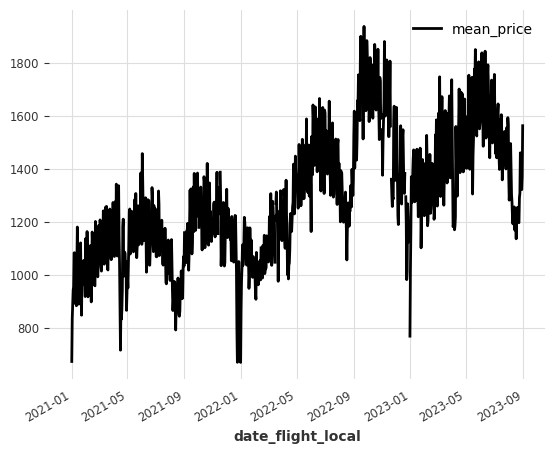

In [16]:
tp_ts={}
for key,df in grouped_dfs.items():
    df['date_flight_local'] = pd.to_datetime(df['date_flight_local'])
    df = df.set_index('date_flight_local')
    tp_ts[f'{key}_mean_price']=TimeSeries.from_series(df['mean_price'], freq='D')

tp_ts['Business_LH_df_mean_price'].plot()

<AxesSubplot:xlabel='date_flight_local'>

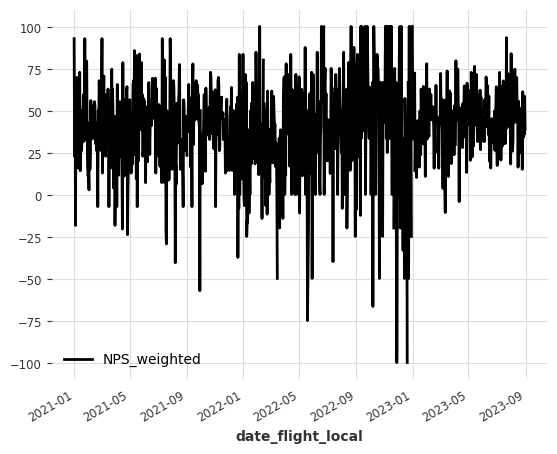

In [17]:
tp_ts={}
for key,df in grouped_dfs.items():
    df['date_flight_local'] = pd.to_datetime(df['date_flight_local'])
    df = df.set_index('date_flight_local')
    tp_ts[f'{key}_NPS']=TimeSeries.from_series(df['NPS_weighted'], freq='D')

tp_ts['Business_LH_df_NPS'].plot()

<AxesSubplot:xlabel='date_flight_local'>

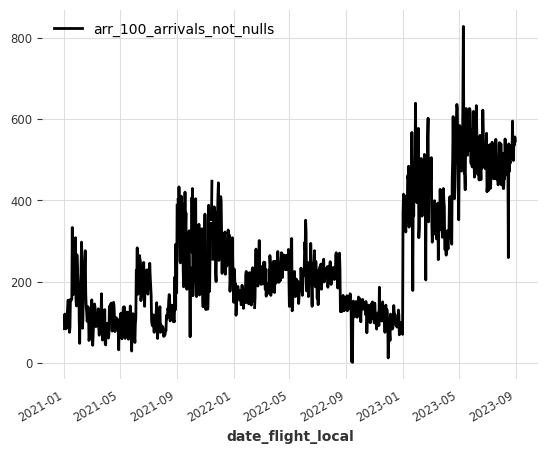

In [13]:
tp_reliability=[col for col in merged_df.columns if col.endswith('_not_nulls')]
tp_ts={}
for key,df in grouped_dfs.items():
    df['date_flight_local'] = pd.to_datetime(df['date_flight_local'])
    df = df.set_index('date_flight_local')
    for tp in tp_reliability:        
        tp_ts[f'{key}_{tp}']=TimeSeries.from_series(df[tp], freq='D')
tp_ts['Economy_SH_df_arr_100_arrivals_not_nulls'].plot()

<AxesSubplot:xlabel='date_flight_local'>

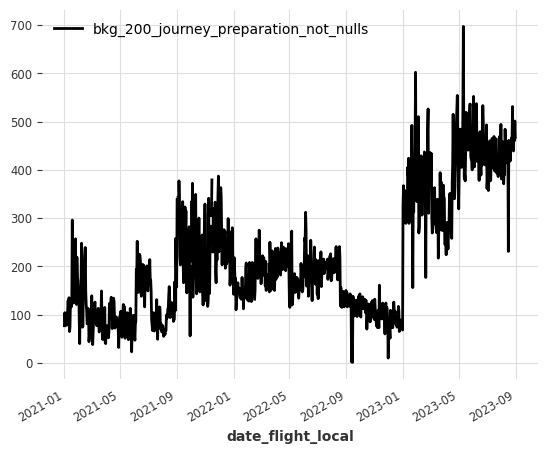

In [13]:
tp_ts['Economy_SH_df_bkg_200_journey_preparation_not_nulls'].plot()

### Check if outliers are correlated with days with low number of answers.

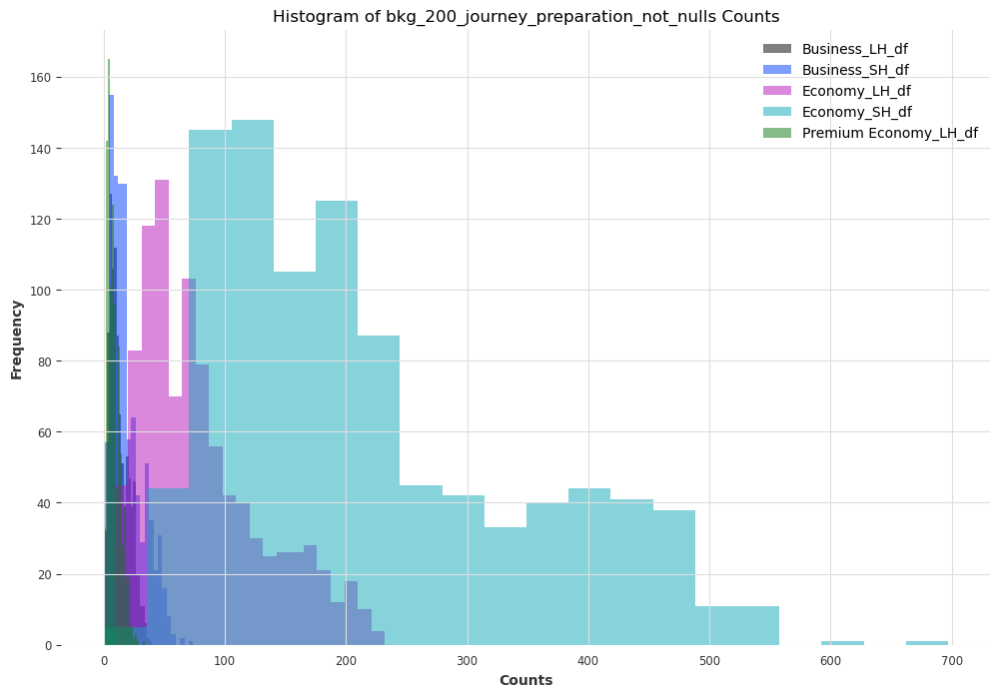

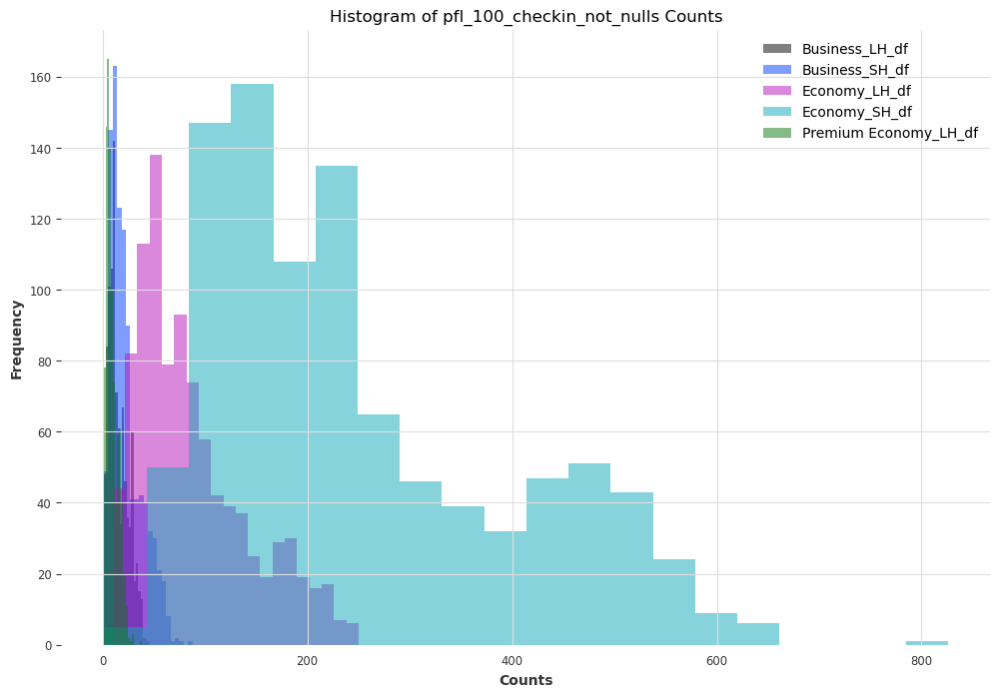

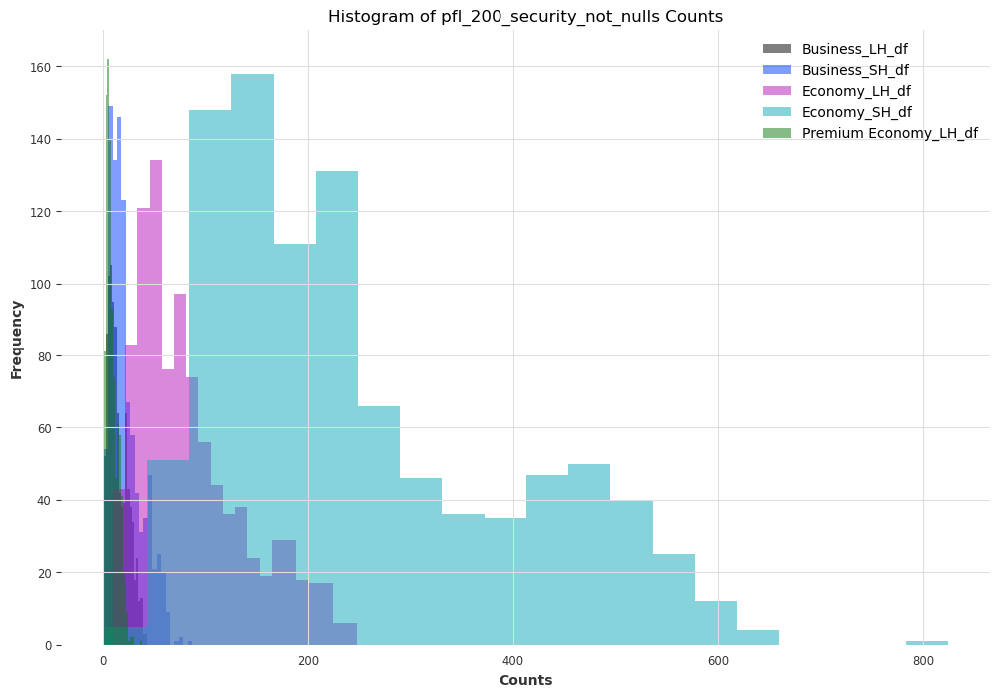

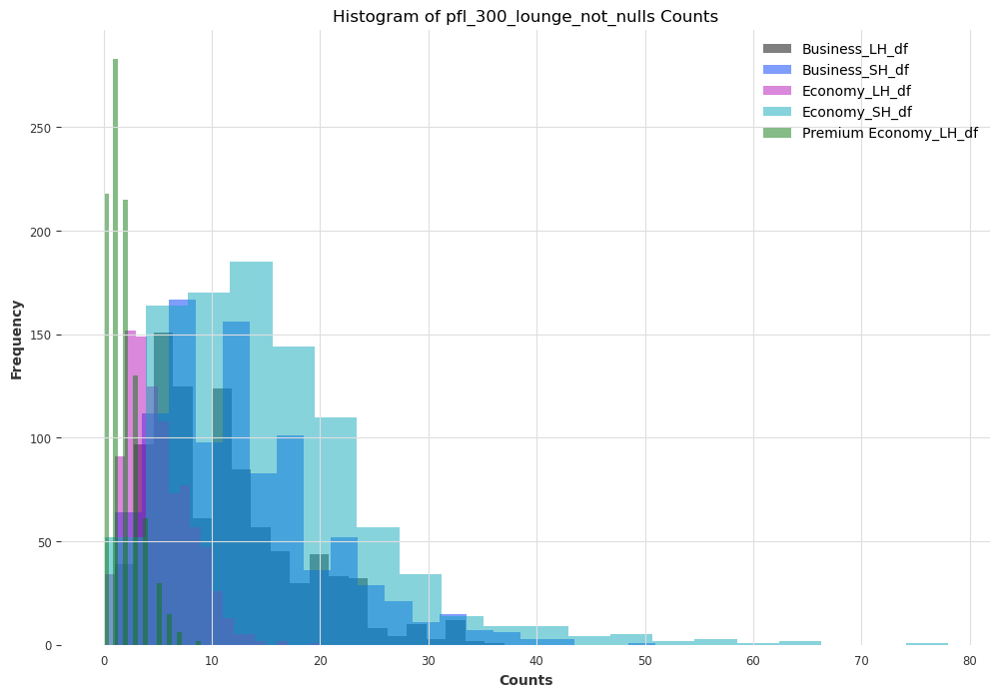

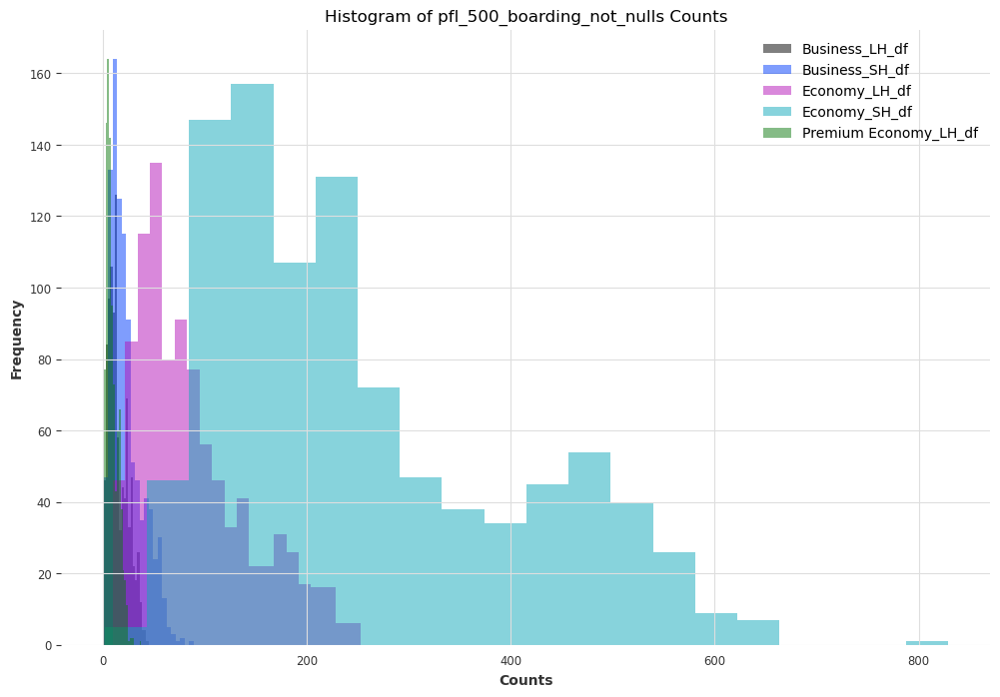

...

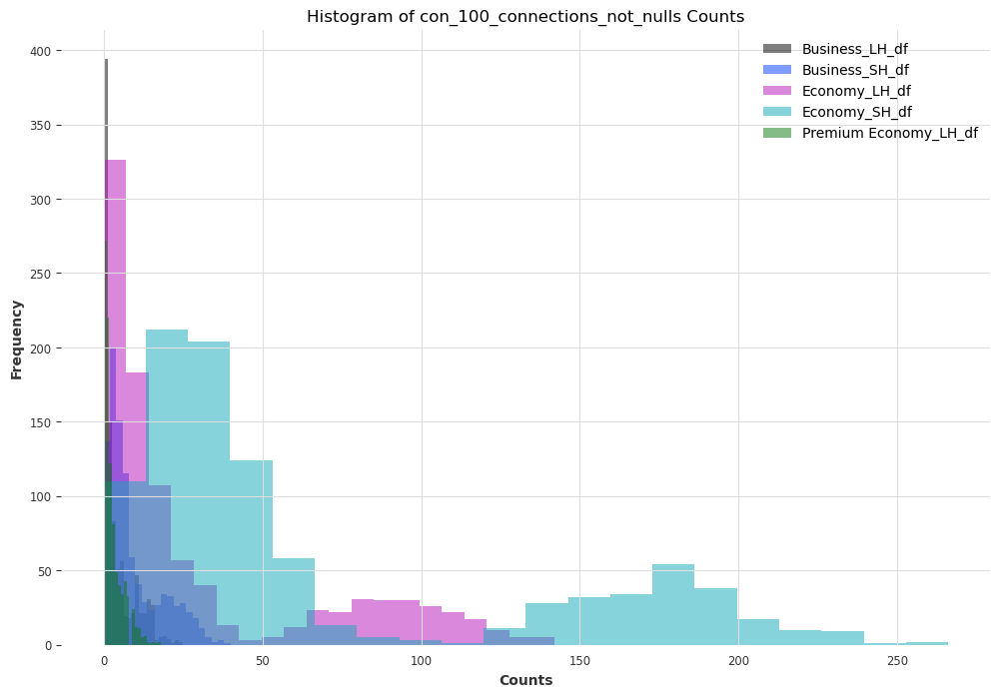

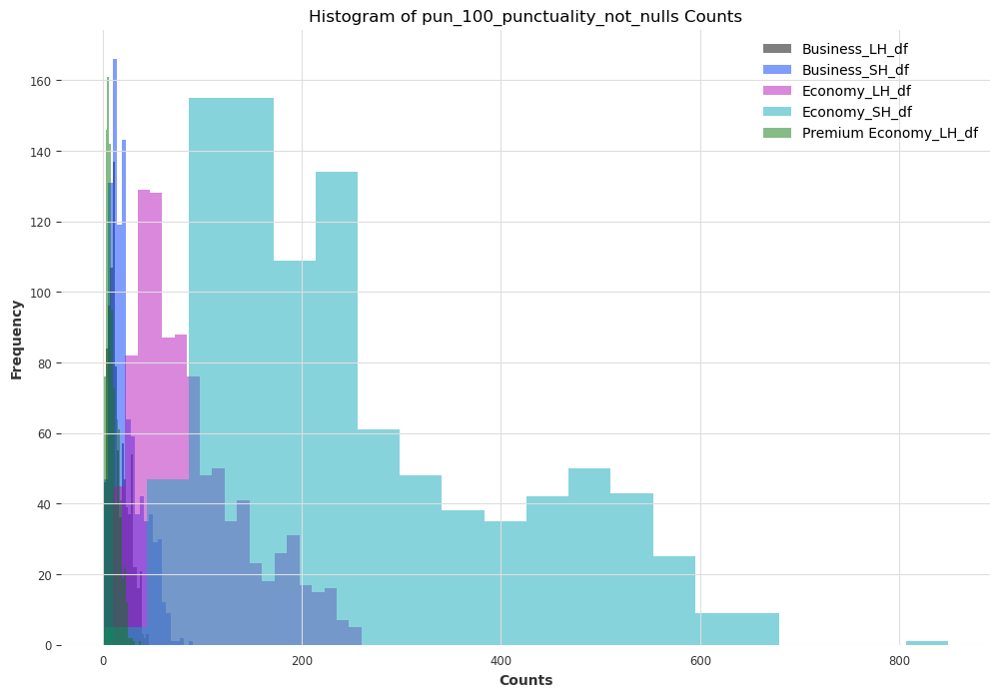

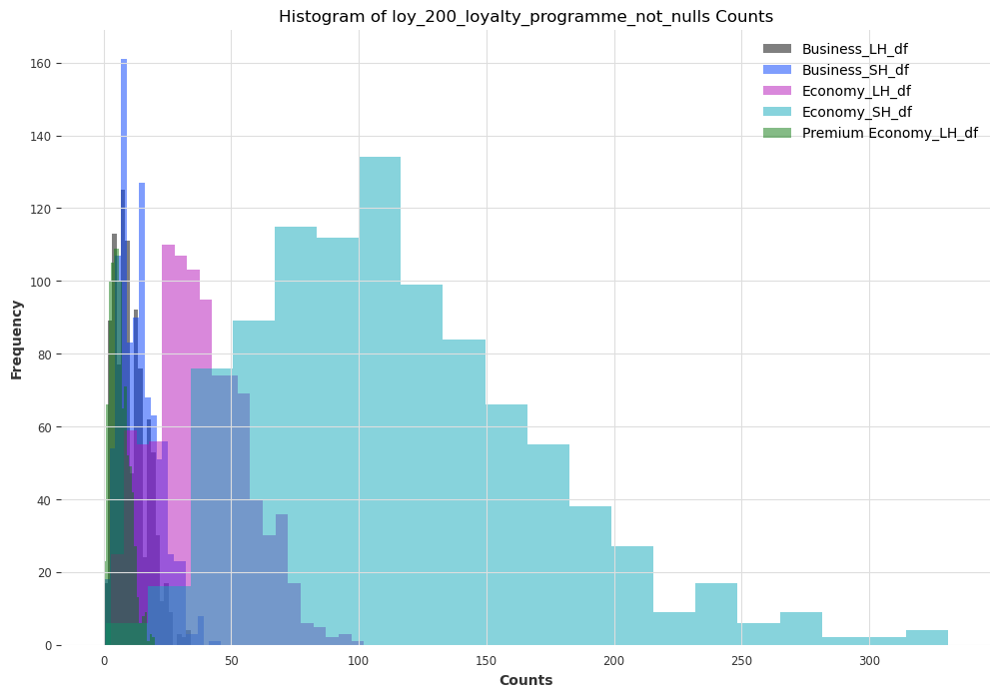

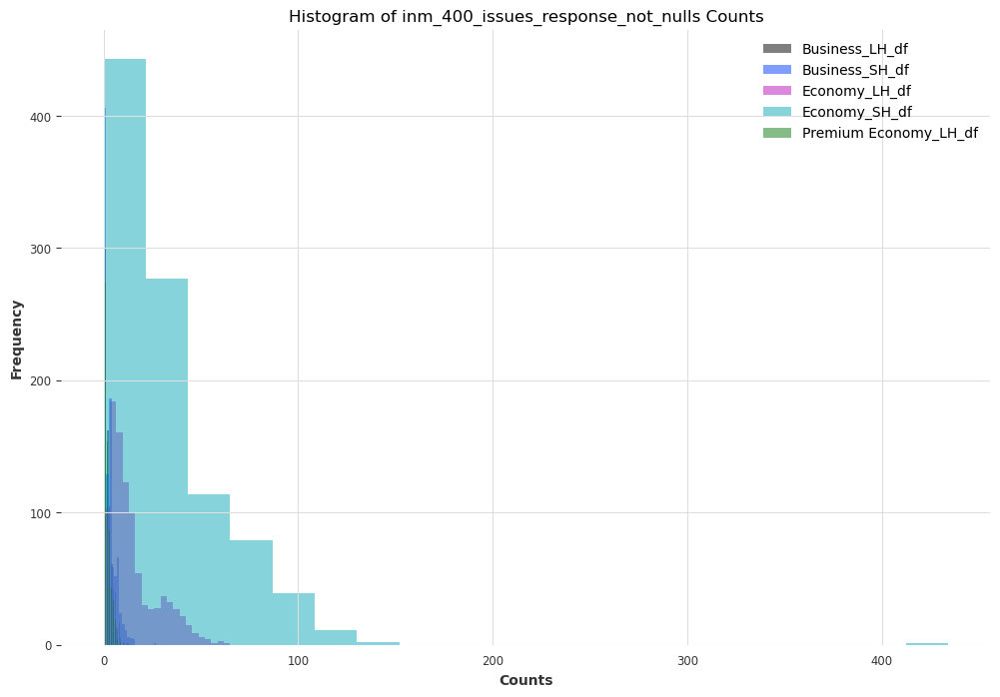

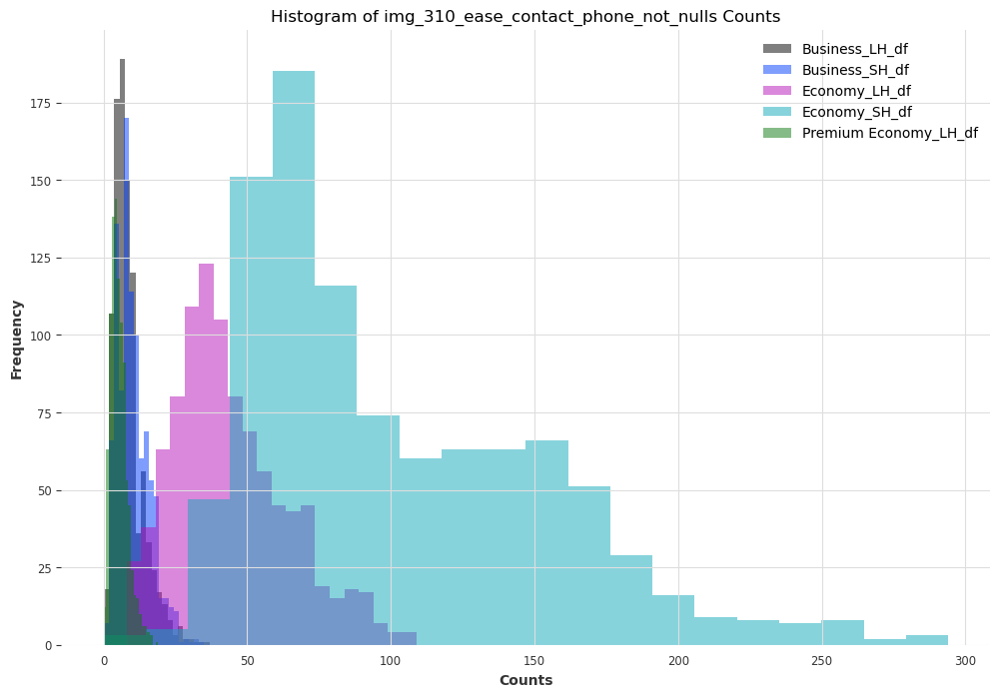

In [16]:
import matplotlib.pyplot as plt

# Loop through each touchpoint reliability column
for tp in tp_reliability:
    # Initialize a figure for the current touchpoint
    plt.figure(figsize=(12, 8))
    
    # Loop through each DataFrame
    for key, df in grouped_dfs.items():
        # Create a histogram for the current touchpoint in the current DataFrame
        plt.hist(df[tp], bins=20, alpha=0.5, label=f'{key}')
    
    # Set plot labels and legend
    plt.xlabel('Counts')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {tp} Counts')
    plt.legend()
    
    # Show the plot for the current touchpoint
    plt.show()






In [23]:
import pandas as pd
import numpy as np

# Define a function to detect outliers using the IQR method
def detect_outliers_iqr(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (data < lower_bound) | (data > upper_bound)

# Iterate through each DataFrame in grouped_dfs.values()
for key,df in grouped_dfs.items():
    # Detect outliers in 'NPS_weighted' column
    nps_outliers = detect_outliers_iqr(df['pfl_100_checkin_satisfaction'])
    
    tp_mean = df['pfl_100_checkin_not_nulls'].mean()
    tp_median=df['pfl_100_checkin_not_nulls'].median()
    
    # Get the values of 'tp' for outliers in 'NPS_weighted'
    outlier_values = df.loc[nps_outliers, 'pfl_100_checkin_not_nulls']
    
    # Print the outlier values for the touchpoints
    print(tp_mean,tp_median)
    print(f"{key} Outliers:")
    print(outlier_values)



15.11318795430945 13.0
Business_LH_df Outliers:
0       3
59      8
195     7
362    10
369    13
386    11
401     6
429     6
497     3
498     4
507     8
536    11
537     5
552     5
562     9
613     3
620     4
633     7
642     5
643     3
673     3
687     2
688     3
700     3
704     2
710     3
Name: pfl_100_checkin_not_nulls, dtype: int64
22.644559585492228 19.0
Business_SH_df Outliers:
9       5
18      6
19      2
40      8
64      4
94      6
100     4
103     7
128     6
131     5
176    10
179    16
191     8
201     8
212     9
339    17
363    28
412     6
455    18
472    17
543    16
614     2
704     5
707     7
Name: pfl_100_checkin_not_nulls, dtype: int64
87.39400206825232 73.0
Economy_LH_df Outliers:
0       39
126     48
416     87
433     23
488     39
500     50
520     62
535     54
589     24
604     39
616     28
649     32
652     16
667     26
706     22
711     24
715     18
718     16
751    143
Name: pfl_100_checkin_not_nulls, dtype: int64
249.69668

### Common transfromations

Since Darts is very sensitive to NaN values, lets fill in those first.

In [11]:
merged_df.describe()

,day,NPS,promoters_weight,detractors_weight,monthly_weight,NPS_weighted,bkg_200_journey_preparation_sum,bkg_200_journey_preparation_std,bkg_200_journey_preparation_mean,bkg_200_journey_preparation_not_nulls,...,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2019,year_2022,year_2023
count,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4776.000000,4816.000000,4821.000000,...,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000
mean,15.727442,31.304678,39.259187,17.749202,74.677748,31.301699,508.542004,2.569626,7.599760,67.769342,...,0.093342,0.096453,0.096453,0.061191,0.062850,0.059324,0.063472,0.373989,0.373989,0.252022
std,8.791545,24.375950,55.257875,25.547520,103.869435,24.380695,757.804077,0.807602,0.870511,100.207011,...,0.290941,0.295242,0.295242,0.239705,0.242718,0.236254,0.243836,0.483911,0.483911,0.434219
min,1.000000,-99.574892,0.000000,0.000000,0.695250,-99.574892,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,18.313167,4.752720,1.472130,8.342070,18.313167,69.000000,2.174862,7.153846,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,16.000000,31.250000,10.398250,3.811060,17.428840,31.250000,165.000000,2.694033,7.623240,21.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,23.000000,44.897910,44.028320,24.991098,88.268490,44.880174,634.000000,3.029029,8.100000,86.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,31.000000,101.418786,319.162160,255.955740,617.995520,101.418786,5631.000000,7.071068,10.000000,697.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


There are only NaN values on mean_price and deviation_price. Since price is obviously very related to cabin/haul, Im going to fill them in grouping by cabin/haul firts.

In [12]:
pip install miceforest

Note: you may need to restart the kernel to use updated packages.


In [13]:
# Create the future covariates time series
original_features=[col for col in merged_df.columns if col.endswith('_satisfaction')] + ['load_factor', 'mean_price'] + [col for col in merged_df.columns if col.startswith('otp15_takeoff')]

In [14]:
import miceforest as mf

for df_name, df in grouped_dfs.items():
    # Create kernel. 
    kds = mf.ImputationKernel(
      df[original_features],  # Use the columns you're using for imputation
      save_all_iterations=True,
      random_state=100
    )

    # Run the MICE algorithm for 2 iterations
    kds.mice(10)

    # Create a copy of the original dataframe with all columns
    filled_df = df.copy()

    # Fill in the NaN values using the completed data from MICE
    filled_df[original_features] = kds.complete_data()

    # Update the grouped_dfs dictionary with the filled dataframe
    grouped_dfs[df_name] = filled_df
    


Hay un cabina/radio que tiene 55 fechas, no 56 ¿?

In [15]:
# Replace the grouped DataFrames with the original merged_df DataFrame
merged_df = pd.concat(grouped_dfs.values())

# Reset the index
merged_df.reset_index(drop=True, inplace=True)

merged_df.describe()

,day,NPS,promoters_weight,detractors_weight,monthly_weight,NPS_weighted,bkg_200_journey_preparation_sum,bkg_200_journey_preparation_std,bkg_200_journey_preparation_mean,bkg_200_journey_preparation_not_nulls,...,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2019,year_2022,year_2023
count,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4776.000000,4816.000000,4821.000000,...,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000
mean,15.727442,31.304678,39.259187,17.749202,74.677748,31.301699,508.542004,2.569626,7.599760,67.769342,...,0.093342,0.096453,0.096453,0.061191,0.062850,0.059324,0.063472,0.373989,0.373989,0.252022
std,8.791545,24.375950,55.257875,25.547520,103.869435,24.380695,757.804077,0.807602,0.870511,100.207011,...,0.290941,0.295242,0.295242,0.239705,0.242718,0.236254,0.243836,0.483911,0.483911,0.434219
min,1.000000,-99.574892,0.000000,0.000000,0.695250,-99.574892,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,18.313167,4.752720,1.472130,8.342070,18.313167,69.000000,2.174862,7.153846,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,16.000000,31.250000,10.398250,3.811060,17.428840,31.250000,165.000000,2.694033,7.623240,21.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,23.000000,44.897910,44.028320,24.991098,88.268490,44.880174,634.000000,3.029029,8.100000,86.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,31.000000,101.418786,319.162160,255.955740,617.995520,101.418786,5631.000000,7.071068,10.000000,697.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [16]:
merged_df.head()

,date_flight_local,day,cabin,haul,NPS,promoters_weight,detractors_weight,monthly_weight,NPS_weighted,bkg_200_journey_preparation_sum,...,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2019,year_2022,year_2023
0,2021-01-01,1,Business,LH,93.136624,1.533603,0.000000,1.533603,93.136624,24.0,...,0,0,0,0,0,0,0,1,0,0
1,2021-01-02,2,Business,LH,23.136624,3.067206,1.533603,5.112010,23.136624,71.0,...,0,0,0,0,0,0,0,1,0,0
2,2021-01-03,3,Business,LH,55.636624,3.067206,0.511201,4.089608,55.636624,60.0,...,0,0,0,0,0,0,0,1,0,0
3,2021-01-04,4,Business,LH,-17.974487,1.022402,1.533603,4.600809,-17.974487,53.0,...,0,0,0,0,0,0,0,1,0,0
4,2021-01-05,5,Business,LH,68.136624,1.533603,0.000000,2.044804,68.136624,26.0,...,0,0,0,0,0,0,0,1,0,0


Alright! With the missing values out of the way we are going to check a couple of things: 1) What are the top5 correlated touchpoints to the NPS by cabin/haul? 2) Among the selected features, which of them show a time dependency? Those would be the ones we need to lag.

In [17]:
#merged_df=merged_df[(merged_df['date_flight_local']!='2022-02-28')& (merged_df['date_flight_local']!='2022-03-31')& (merged_df['date_flight_local']!='2022-04-30')]

In [18]:
merged_df.describe()

,day,NPS,promoters_weight,detractors_weight,monthly_weight,NPS_weighted,bkg_200_journey_preparation_sum,bkg_200_journey_preparation_std,bkg_200_journey_preparation_mean,bkg_200_journey_preparation_not_nulls,...,month_6,month_7,month_8,month_9,month_10,month_11,month_12,year_2019,year_2022,year_2023
count,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4776.000000,4816.000000,4821.000000,...,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000,4821.000000
mean,15.727442,31.304678,39.259187,17.749202,74.677748,31.301699,508.542004,2.569626,7.599760,67.769342,...,0.093342,0.096453,0.096453,0.061191,0.062850,0.059324,0.063472,0.373989,0.373989,0.252022
std,8.791545,24.375950,55.257875,25.547520,103.869435,24.380695,757.804077,0.807602,0.870511,100.207011,...,0.290941,0.295242,0.295242,0.239705,0.242718,0.236254,0.243836,0.483911,0.483911,0.434219
min,1.000000,-99.574892,0.000000,0.000000,0.695250,-99.574892,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,18.313167,4.752720,1.472130,8.342070,18.313167,69.000000,2.174862,7.153846,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,16.000000,31.250000,10.398250,3.811060,17.428840,31.250000,165.000000,2.694033,7.623240,21.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,23.000000,44.897910,44.028320,24.991098,88.268490,44.880174,634.000000,3.029029,8.100000,86.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,31.000000,101.418786,319.162160,255.955740,617.995520,101.418786,5631.000000,7.071068,10.000000,697.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [19]:
grouped_dfs = {}

# Group the original DataFrame by the 'cabin' and 'haul' columns
grouped = merged_df.groupby(['cabin', 'haul'])

# Iterate through each group and create a DataFrame
for group_name, group_data in grouped:
    cabin_value, haul_value = group_name
    group_df = group_data.copy()  # Create a copy of the group's data
    group_df_name = f'{cabin_value}_{haul_value}_df'  # Generate a unique name
    grouped_dfs[group_df_name] = group_df

In [20]:
# Replace the grouped DataFrames with the original merged_df DataFrame
merged_df = pd.concat(grouped_dfs.values())

# Reset the index
merged_df.reset_index(drop=True, inplace=True)

### Reports and model directories

In [21]:
import os
output_dir={}
models_dir={}
for key in grouped_dfs.keys():
    # Create the output directory if it doesn't exist
    output_dir[key] = f"Lags/Daily/All_tp_all_var_reports/{key}_report"
    if not os.path.exists(output_dir[key]):
        os.makedirs(output_dir[key])  
    # Create the output directory if it doesn't exist
    models_dir[key] = f"Lags/Daily/All_tp_all_var_best_models"
    if not os.path.exists(models_dir[key]):
        os.makedirs(models_dir[key])

### Correlation matrixes

In [22]:
def get_top_correlated_features(df, n):
    # Select only the float columns from the DataFrame
    float_columns = df.select_dtypes(include=['float64'])

    # Calculate the correlation matrix for the float columns
    correlation_matrix = float_columns.corr()

    # Get the correlation values of each feature with NPS and sort them by absolute values in descending order
    nps_correlations = correlation_matrix['NPS_weighted'].drop('NPS_weighted').abs().sort_values(ascending=False)

    # Get the top 'n' features with the highest correlations among float features
    top_n_correlated_features = nps_correlations.nlargest(n).index.tolist()
    
    # Create a subset of the correlation matrix with only the top correlated features and NPS
    correlation_matrix_subset = correlation_matrix.loc[top_n_correlated_features + ['NPS_weighted'], top_n_correlated_features + ['NPS_weighted']]

    return top_n_correlated_features, correlation_matrix_subset


for df_id, value in grouped_dfs.items():
    # Get the top correlated features and the correlation matrix for this DataFrame
    top_correlated_features, correlation_matrix = get_top_correlated_features(value[[col for col in value.columns if col.endswith('_satisfaction')]+ ['NPS_weighted']], 17)
    
    # Print the top correlated features
    print(f"Top correlated features for '{df_id}': {', '.join(top_correlated_features)}")
    
    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    
    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap="Blues", center=0, mask=mask)
    plt.title(f"Correlation Heatmap for '{df_id}'")
    plt.savefig(f"{output_dir[df_id]}/correlation_matrix_{df_id}.png")
    plt.close()



Top correlated features for 'Business_LH_df': ifl_300_cabin_satisfaction, ifl_100_cabin_crew_satisfaction, ifl_400_food_drink_satisfaction, arr_100_arrivals_satisfaction, pfl_500_boarding_satisfaction, pfl_100_checkin_satisfaction, ifl_200_flight_crew_annoucements_satisfaction, bkg_200_journey_preparation_satisfaction, pun_100_punctuality_satisfaction, ifl_500_ife_satisfaction, loy_200_loyalty_programme_satisfaction, pfl_200_security_satisfaction, img_310_ease_contact_phone_satisfaction, pfl_300_lounge_satisfaction, ifl_600_wifi_satisfaction, inm_400_issues_response_satisfaction, con_100_connections_satisfaction
Top correlated features for 'Business_SH_df': ifl_300_cabin_satisfaction, pfl_100_checkin_satisfaction, pfl_500_boarding_satisfaction, ifl_400_food_drink_satisfaction, arr_100_arrivals_satisfaction, ifl_100_cabin_crew_satisfaction, pun_100_punctuality_satisfaction, bkg_200_journey_preparation_satisfaction, ifl_200_flight_crew_annoucements_satisfaction, pfl_200_security_satisfac

### Clusteres

#### Manual

In [23]:
feature_clusters={}
for key in grouped_dfs.keys():
    feature_clusters[key]= {'pre_post_travel': ['bkg_200_journey_preparation_satisfaction','pfl_100_checkin_satisfaction','img_310_ease_contact_phone_satisfaction','inm_400_issues_response_satisfaction'], 'staff': ['ifl_100_cabin_crew_satisfaction','ifl_200_flight_crew_annoucements_satisfaction'], 'time_related': ['pun_100_punctuality_satisfaction','con_100_connections_satisfaction','arr_100_arrivals_satisfaction'], 'airplane_comodities': ['ifl_500_ife_satisfaction','ifl_300_cabin_satisfaction','ifl_400_food_drink_satisfaction', 'ifl_600_wifi_satisfaction'],'preferential_treatment':['loy_200_loyalty_programme_satisfaction','pfl_300_lounge_satisfaction'], "waiting_times": ['pfl_200_security_satisfaction', 'pfl_500_boarding_satisfaction','pfl_100_checkin_satisfaction'], }

#### Agglomerative Clustering

#### K-means

### PCA in clusters

### Feature selection based on Pearson

### Feature selection based on VIF

In [24]:
[col for col in merged_df.columns if col.startswith('otp15')]

['otp15_landing', 'otp15_takeoff']

### Sporiously correlated touchpoints (common cofounders)

In [25]:
[col for col in merged_df.columns if col.endswith('satisfaction')]

['bkg_200_journey_preparation_satisfaction',
 'pfl_100_checkin_satisfaction',
 'pfl_200_security_satisfaction',
 'pfl_300_lounge_satisfaction',
 'pfl_500_boarding_satisfaction',
 'ifl_300_cabin_satisfaction',
 'ifl_200_flight_crew_annoucements_satisfaction',
 'ifl_600_wifi_satisfaction',
 'ifl_500_ife_satisfaction',
 'ifl_400_food_drink_satisfaction',
 'ifl_100_cabin_crew_satisfaction',
 'arr_100_arrivals_satisfaction',
 'con_100_connections_satisfaction',
 'pun_100_punctuality_satisfaction',
 'loy_200_loyalty_programme_satisfaction',
 'inm_400_issues_response_satisfaction',
 'img_310_ease_contact_phone_satisfaction']

### Select features to train with

So we have that all cabin/haul top_5 correlated touchpoints are the same, although not equally sorted. let us filter our dataframe by those touchpoints:

In [26]:
# Create the output directory if it doesn't exist
df_dir = "Lags/Daily/dataframes_alltp_allvar_Adjusted_NPS"
if not os.path.exists(df_dir):
    os.makedirs(df_dir)

#### All touchpoints and variables

In [27]:
features={}
for df_id, df in grouped_dfs.items():
    # Get the top correlated features and the correlation matrix for this DataFrame
    features[df_id]=[col for col in merged_df.columns if col.endswith('_satisfaction')] + ['load_factor', 'mean_price'] + [col for col in merged_df.columns if col.startswith('otp15_takeoff')]
    # Define the columns to keep in the desired order
    cols_to_keep = ['date_flight_local', 'cabin', 'haul'] + features[df_id] + ['NPS_weighted']
    # Keep only the specified columns in the desired order
    df = df[cols_to_keep]
    df.to_csv(f'{df_dir}/Adjusted_NPS_{df_id}', index=False)
    grouped_dfs[df_id]=df

#### Just all touchpoints

#### Top importance for business touchpoints and all variables

#### Just top importance for business touchpoints

#### Top_5_tp and all variables

Lets check the time dependencies of these features:

#### PCA components

Therefore, the variables to lag are going to be:

1) Business_LH: [load_factor, mean_price] + [col for col in df.columns if col.startswith('otp')]
2) Business_SH: [load_factor, mean_price, deviation_price] + [col for col in df.columns if col.startswith('otp')]
3) Economy_LH: [load_factor, mean_price, deviation_price] + [col for col in df.columns if col.startswith('otp')]
4) Economy_SH: [pun_100_punctuality_satisfaction, load_factor, mean_price, deviation_price] + [col for col in df.columns if col.startswith('otp')]


One thing we can also notice is how March 2023 is deeply affected by the strikes that took place during that month. Until we get more variables lets smooth out that month a bit by taking the mean value (for each variable) of 2019 and 2022.

In [29]:
grouped_dfs['Premium Economy_LH_df'].describe()

,bkg_200_journey_preparation_satisfaction,pfl_100_checkin_satisfaction,pfl_200_security_satisfaction,pfl_300_lounge_satisfaction,pfl_500_boarding_satisfaction,ifl_300_cabin_satisfaction,ifl_200_flight_crew_annoucements_satisfaction,ifl_600_wifi_satisfaction,ifl_500_ife_satisfaction,ifl_400_food_drink_satisfaction,...,arr_100_arrivals_satisfaction,con_100_connections_satisfaction,pun_100_punctuality_satisfaction,loy_200_loyalty_programme_satisfaction,inm_400_issues_response_satisfaction,img_310_ease_contact_phone_satisfaction,load_factor,mean_price,otp15_takeoff,NPS_weighted
count,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,...,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000
mean,65.208396,73.097511,76.710925,58.190724,73.186331,72.902890,76.217645,26.510522,68.709741,49.103180,...,72.833347,45.236243,84.138618,60.515982,9.274719,44.814724,85.035808,671.880510,85.720349,30.475305
std,21.979380,19.258863,19.736479,42.691104,19.137519,19.017985,18.496169,33.537275,28.184861,21.956613,...,19.462166,41.088911,15.878887,27.329919,24.166727,26.641614,9.516155,119.043895,8.267632,33.892104
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,42.067736,418.640000,33.962264,-98.581214
25%,50.000000,62.500000,66.666667,0.000000,62.500000,63.516746,66.666667,0.000000,57.142857,34.803922,...,62.500000,0.000000,75.000000,50.000000,0.000000,28.571429,80.155023,577.785000,81.991803,11.945243
50%,66.666667,75.000000,80.000000,66.666667,75.000000,75.000000,78.571429,0.000000,74.342105,50.000000,...,75.000000,50.000000,85.714286,62.500000,0.000000,50.000000,87.093921,649.610000,87.272727,32.778576
75%,80.000000,85.714286,90.000000,100.000000,85.714286,85.714286,88.888889,50.000000,90.000000,63.636364,...,85.714286,85.714286,100.000000,80.000000,0.000000,60.000000,92.058842,769.025000,91.379310,51.418786
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,1016.000000,100.000000,101.418786


# Adjusted NPS training

## Experiments

In [30]:
models = ['RandomForest']
add_encoders = {
    'cyclic': {'future': ['month']},
    'transformer': Scaler()
}
model_params = [    

    # Temporal lags for NPS and covariates
    {"lags": 12, "lags_future_covariates": [0], "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0], "lags_past_covariates": [-1,-2,-3,-4,-5,-6], "output_chunk_length": 1},
    {"lags": 12, "lags_future_covariates": [0], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0], "lags_past_covariates": [-1, -3, -6], "output_chunk_length": 1},
    #{"lags": 12, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], "output_chunk_length": 6},
    #{"lags": 6, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1,-2,-3,-4,-5,-6], "output_chunk_length": 6},
    #{"lags": 12, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 6},
    #{"lags": 6, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1, -3, -6], "output_chunk_length": 6},
    
    # Temporal lags for the NPS alone.
    {"lags": 12, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    {"lags": 12, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    #{"lags": 12, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1], "output_chunk_length": 6},
    #{"lags": 6, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1], "output_chunk_length": 6},
    #{"lags": 12, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1], "output_chunk_length": 6},
    #{"lags": 6, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1], "output_chunk_length": 6},    
    
    
    # Temporal lags for the covariates alone.
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], "output_chunk_length": 1},
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1,-2,-3,-4,-5,-6], "output_chunk_length": 1},
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 1},
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -3, -6], "output_chunk_length": 1},
    #{"lags": 1, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], "output_chunk_length": 6},
    #{"lags": 1, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1,-2,-3,-4,-5,-6], "output_chunk_length": 6},
    #{"lags": 1, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 6},
    #{"lags": 1, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-1, -3, -6], "output_chunk_length": 6},    
    
    
    # Almost Non temporal lags. 
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    #{"lags": 1, "lags_future_covariates": [0,1], "lags_past_covariates": [-1], "output_chunk_length": 2},
    #{"lags": 1, "lags_future_covariates": [0,1,2], "lags_past_covariates": [-1], "output_chunk_length": 3},
    #{"lags": 1, "lags_future_covariates": [0,1,2,3,4,5], "lags_past_covariates": [-1], "output_chunk_length": 6},
    
    # Non temporal lags. 
    {"lags_future_covariates": [0], "output_chunk_length": 1},
    #{"lags_future_covariates": [0,1], "output_chunk_length": 2},
    #{"lags_future_covariates": [0,1,2], "output_chunk_length": 3},
    #{"lags_future_covariates": [0,1,2,3,4,5], "output_chunk_length": 6},
    
]


In [24]:
model_params = [    
    # Non temporal lags. 
    {"lags_future_covariates": [0], "output_chunk_length": 1}    
]


### TRAIN AND VAL DAILY GRANULARITY

### TRAIN WITH DAILY GRANULARITY AND VAL WITH MONTHLY

In [26]:
monthly_df=pd.read_csv('monthly_NPS_5ch_Touchpoints_adjusted_complete')

In [27]:
monthly_grouped_dfs = {}

# Group the original DataFrame by the 'cabin' and 'haul' columns
monthly_grouped = monthly_df.groupby(['cabin', 'haul'])

# Iterate through each group and create a DataFrame
for group_name, group_data in monthly_grouped:
    cabin_value, haul_value = group_name
    group_df = group_data.copy()  # Create a copy of the group's data
    group_df_name = f'{cabin_value}_{haul_value}_df'  # Generate a unique name
    monthly_grouped_dfs[group_df_name] = group_df
    
for key in grouped_dfs.keys():
    df = monthly_grouped_dfs[key]  # Access the DataFrame using the key
    
    df['date_flight_local']=pd.to_datetime(df['date_flight_local'])
    
    df = df[df['date_flight_local'].dt.year.isin([2019, 2022, 2023])]
    
    df['date_flight_local'] = df['date_flight_local'].apply(lambda x: x.replace(year=2021) if x.year == 2019 else x)
    
    df = df.reset_index(drop=True)
    
    monthly_grouped_dfs[key] = df# Replace the grouped DataFrames with the original merged_df DataFrame
monthly_df = pd.concat(monthly_grouped_dfs.values())

# Reset the index
monthly_df.reset_index(drop=True, inplace=True)

monthly_df.head()

,date_flight_local,year,month,cabin,haul,NPS,promoters_weight,detractors_weight,monthly_weight,NPS_weighted,...,mean_price,deviation_price,otp3_landing,otp14_landing,otp15_landing,otp60_landing,otp3_takeoff,otp14_takeoff,otp15_takeoff,otp60_takeoff
0,2021-01-31,2019,1,Business,LH,42.222786,121.665838,25.560050,195.789983,42.222786,...,976.46,901.539620,63.265306,76.530612,77.551020,97.959184,56.122449,76.530612,80.612245,97.959184
1,2021-02-28,2019,2,Business,LH,40.075400,113.669117,26.158165,186.436376,40.075400,...,1060.33,932.449649,61.640798,78.713969,80.413895,98.078344,69.179601,87.804878,89.430894,98.373984
2,2021-03-31,2019,3,Business,LH,39.648252,135.857876,30.774436,225.929396,39.648252,...,1161.61,979.200983,64.638783,79.277567,80.798479,96.641318,68.757921,84.410646,85.868188,97.084918
3,2021-04-30,2019,4,Business,LH,31.650138,128.308856,41.757320,224.730304,31.650138,...,1073.66,936.824143,58.622829,75.682382,76.674938,96.712159,62.965261,83.560794,85.669975,96.650124
4,2021-05-31,2019,5,Business,LH,46.491257,164.737385,30.536686,251.525861,46.491257,...,1170.74,994.345020,67.111369,80.916473,81.844548,96.461717,69.083527,84.222738,86.948956,96.171694


In [32]:
[col for col in monthly_df.columns if col.endswith('_not_nulls')]

['bkg_200_journey_preparation_not_nulls',
 'pfl_100_checkin_not_nulls',
 'pfl_200_security_not_nulls',
 'pfl_300_lounge_not_nulls',
 'pfl_500_boarding_not_nulls',
 'ifl_300_cabin_not_nulls',
 'ifl_200_flight_crew_annoucements_not_nulls',
 'ifl_600_wifi_not_nulls',
 'ifl_500_ife_not_nulls',
 'ifl_400_food_drink_not_nulls',
 'ifl_100_cabin_crew_not_nulls',
 'arr_100_arrivals_not_nulls',
 'con_100_connections_not_nulls',
 'pun_100_punctuality_not_nulls',
 'loy_200_loyalty_programme_not_nulls',
 'inm_400_issues_response_not_nulls',
 'img_310_ease_contact_phone_not_nulls']

<AxesSubplot:xlabel='date_flight_local'>

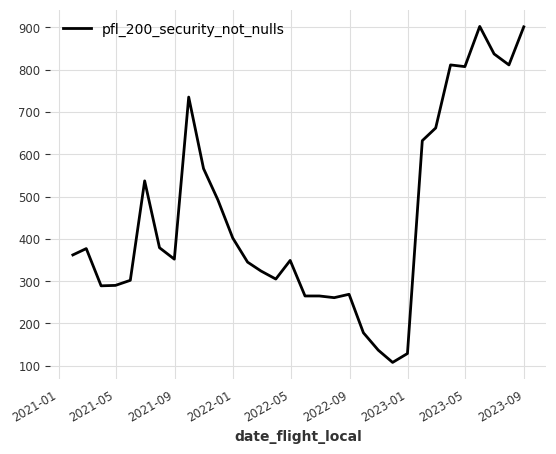

In [33]:
tp_reliability=[col for col in monthly_df.columns if col.endswith('_not_nulls')]
tp_ts={}
for key,df in monthly_grouped_dfs.items():
    df['date_flight_local'] = pd.to_datetime(df['date_flight_local'])
    df = df.set_index('date_flight_local')
    for tp in tp_reliability:        
        tp_ts[f'{key}_{tp}']=TimeSeries.from_series(df[tp], freq='M')
tp_ts['Business_LH_df_pfl_200_security_not_nulls'].plot()

In [34]:
def fill_missing_dates(df, freq):
    # Create a date range covering the expected time period
    start_date = df['date_flight_local'].min()
    end_date = df['date_flight_local'].max()
    expected_dates = pd.date_range(start_date, end_date, freq=freq)

    # Reindex the DataFrame with the expected dates
    df = df.set_index('date_flight_local').reindex(expected_dates)

    # Use forward fill to fill missing values in other columns
    df.fillna(method='ffill', inplace=True)

    # Reset the index to have 'date_flight_local' as a regular column
    df.reset_index(inplace=True)
    
    # Rename the index column back to 'date_flight_local'
    df.rename(columns={'index': 'date_flight_local'}, inplace=True)

    return df

# Apply the fill_missing_dates function to each DataFrame in grouped_dfs.values()
for key, df in grouped_dfs.items():
    grouped_dfs[key] = fill_missing_dates(df,freq='D')
    
for key, df in monthly_grouped_dfs.items():
    monthly_grouped_dfs[key] = fill_missing_dates(df, freq='M')

In [35]:
import miceforest as mf

for df_name, df in monthly_grouped_dfs.items():
    # Create kernel. 
    kds = mf.ImputationKernel(
      df[original_features],  # Use the columns you're using for imputation
      save_all_iterations=True,
      random_state=100
    )

    # Run the MICE algorithm for 2 iterations
    kds.mice(10)

    # Create a copy of the original dataframe with all columns
    filled_df = df.copy()

    # Fill in the NaN values using the completed data from MICE
    filled_df[original_features] = kds.complete_data()

    # Update the grouped_dfs dictionary with the filled dataframe
    monthly_grouped_dfs[df_name] = filled_df

#### Just top touchpoints for bussines

#### Just all tocuhpoints

#### ALl tp and all variables

In [36]:
features={}
for df_id, df in monthly_grouped_dfs.items():
    # Get the top correlated features and the correlation matrix for this DataFrame
    features[df_id]=[col for col in monthly_df.columns if col.endswith('_satisfaction')] + ['load_factor', 'mean_price'] + [col for col in monthly_df.columns if col.startswith('otp15_takeoff')]
    # Define the columns to keep in the desired order
    cols_to_keep = ['date_flight_local', 'cabin', 'haul'] + features[df_id] + ['NPS_weighted']
    # Keep only the specified columns in the desired order
    df = df[cols_to_keep]
    df.to_csv(f'{df_dir}/Adjusted_NPS_{df_id}', index=False)
    monthly_grouped_dfs[df_id]=df

In [37]:
def count_missing_dates(df):
    # Create a date range covering the expected time period
    start_date = df['date_flight_local'].min()
    end_date = df['date_flight_local'].max()    
    expected_dates = pd.date_range(start_date, end_date, freq='D')
    # Calculate missing dates
    missing_dates = expected_dates[~expected_dates.isin(df['date_flight_local'])]

    # Count the number of missing dates
    missing_dates_count = len(missing_dates)

    return missing_dates_count

# Create a dictionary to store the missing date counts for each DataFrame
missing_dates_counts = {}

# Calculate missing date counts for each DataFrame in grouped_dfs
for key, df in grouped_dfs.items():
    missing_dates_counts[key] = count_missing_dates(df)
    
missing_dates_counts

{'Business_LH_df': 0,
 'Business_SH_df': 0,
 'Economy_LH_df': 0,
 'Economy_SH_df': 0,
 'Premium Economy_LH_df': 0}

### Using Random Forest

In [38]:
def train_and_save_best_mae_models(models, model_params_list, grouped_dfs, monthly_grouped_dfs, output_dir, model_save_dir):
    best_models_by_dataframe = {}
    
    start_date = pd.to_datetime('2023-09-30')
    nps_ts_dict = {}  # Create an empty dictionary to store nps_ts for each dataframe
    pred_ts_dict= {}
    future_scaler_dict={}
    for model_name in models:
        for model_params in model_params_list:
            for key in grouped_dfs.keys():
                df=grouped_dfs[key]
                df['date_flight_local'] = pd.to_datetime(df['date_flight_local'])
                df = df.set_index('date_flight_local')
                df = df.fillna(0)
                
                pred_df=monthly_grouped_dfs[key]
                pred_df['date_flight_local'] = pd.to_datetime(pred_df['date_flight_local'])
                pred_df = pred_df.set_index('date_flight_local')
                pred_df = pred_df.fillna(0)
                
                
                
                nps_ts_dict[key] = TimeSeries.from_series(df['NPS_weighted'], freq='D') 
                past_covariates_ts = TimeSeries.from_series(df[lag_features[key]], freq='D')
                future_covariates_ts = TimeSeries.from_series(df[features[key]], freq='D') 
                
                pred_ts_dict[key] = TimeSeries.from_series(pred_df['NPS_weighted'], freq='M') 
                pred_past_covariates_ts = TimeSeries.from_series(pred_df[lag_features[key]], freq='M')
                pred_future_covariates_ts = TimeSeries.from_series(pred_df[features[key]], freq='M') 
                
                
                # past_scaler = Scaler()
                # past_scaler.fit(past_covariates_ts)
                # train_past_covariates_ts_scaled = past_scaler.transform(past_covariates_ts) 
                
                future_scaler = Scaler()
                future_scaler.fit(future_covariates_ts)
                future_scaler_dict[key]=future_scaler
                train_future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)                
                pred_future_covariates_ts_scaled = future_scaler.transform(pred_future_covariates_ts)

                if model_name == 'LightGBMModel':
                    model = LightGBMModel(**model_params)
                elif model_name == 'RandomForest':
                    model = RandomForest(**model_params)
                elif model_name == 'LinearRegressionModel':
                    model = LinearRegressionModel(**model_params)
                else:
                    raise ValueError(f"Unknown model name: {model_name}")
                
                if "lags_past_covariates" in model_params.keys():
                    model.fit(nps_ts_dict[key], future_covariates=train_future_covariates_ts_scaled, past_covariates=train_past_covariates_ts_scaled)
                    pred_series = model.predict(n=180, series=train_ts, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled)
                else:
                    model.fit(nps_ts_dict[key], future_covariates=train_future_covariates_ts_scaled)
                    pred_series = model.predict(n=31, series= pred_ts_dict[key][:1], future_covariates=pred_future_covariates_ts_scaled)
                    
                #pred_series = nps_scaler.inverse_transform(pred_series_scaled)
                mae = mean_absolute_error(pred_ts_dict[key][1:].values(), pred_series.values())
                mape = mean_absolute_percentage_error(pred_ts_dict[key][1:].values(), pred_series.values())

                if key not in best_models_by_dataframe or mae < best_models_by_dataframe[key]['mae']:
                    best_models_by_dataframe[key] = {
                        'model_name': model_name,
                        'mae': mae,
                        'mape': mape,
                        'params': model_params,
                        'pred_series': pred_series,
                        'model': model  # Save the model instance in the dictionary
                    }

    # Save the best models after all loops
    for df_id, value in best_models_by_dataframe.items():
        best_model_path = os.path.join(model_save_dir[df_id], f"best_mae_model_{df_id}_{value['model_name']}.pkl")
        with open(best_model_path, 'wb') as model_file:
            pickle.dump(value['model'], model_file)

    for df_id, value in best_models_by_dataframe.items():
        plt.figure(figsize=(10, 6))
        value['pred_series'].plot(label='Predicted NPS')
        pred_ts_dict[df_id].plot(label='Actual NPS')  # Use the correct nps_ts for each dataframe
        plt.title(f"'{df_id}' - mae - {value['model_name']}")
        plt.xlabel("Date")
        plt.ylabel("NPS adjusted")
        plt.legend()
        plt.savefig(f"{output_dir[df_id]}/forecast_{df_id}_mae_{value['model_name']}.png")
        plt.close()

    return best_models_by_dataframe, nps_ts_dict, pred_ts_dict, future_scaler_dict

# Assuming you have the grouped_dfs dictionary defined
best_mae_models_by_dataframe, nps_ts_dict_mae, pred_ts_dict_mae, future_scaler_dict_mae = train_and_save_best_mae_models(models, model_params, grouped_dfs, monthly_grouped_dfs, output_dir, models_dir)

### Using different regressors from RegressionModel()

### Evaluation

In [39]:
# Print the best models for each dataframe
for df_id, value in best_mae_models_by_dataframe.items():
    print(f"Best Mae Model for DataFrame '{df_id}':")
    print("Model Name:", value['model_name'])
    print("MAE:", format(value['mae'], '.3f'))
    print("MAPE:", format(value['mape'], '.3f'))
    print("Params:", value['params'])
    print()


Best Mae Model for DataFrame 'Business_LH_df':
Model Name: RandomForest
MAE: 3.183
MAPE: 0.086
Params: {'lags_future_covariates': [0], 'output_chunk_length': 1}

Best Mae Model for DataFrame 'Business_SH_df':
Model Name: RandomForest
MAE: 3.361
MAPE: 0.101
Params: {'lags_future_covariates': [0], 'output_chunk_length': 1}

Best Mae Model for DataFrame 'Economy_LH_df':
Model Name: RandomForest
MAE: 1.927
MAPE: 0.136
Params: {'lags_future_covariates': [0], 'output_chunk_length': 1}

Best Mae Model for DataFrame 'Economy_SH_df':
Model Name: RandomForest
MAE: 1.344
MAPE: 0.055
Params: {'lags_future_covariates': [0], 'output_chunk_length': 1}

Best Mae Model for DataFrame 'Premium Economy_LH_df':
Model Name: RandomForest
MAE: 4.045
MAPE: 0.141
Params: {'lags_future_covariates': [0], 'output_chunk_length': 1}



In [40]:
# Loop through the DataFrame IDs
for df_id, value in best_mae_models_by_dataframe.items():
    # Create a DataFrame with labels and values
    data = {
        "Metric": ["Model Name", "MAE", "MAPE"],
        "Value": [value['model_name'], format(value['mae'], '.3f'), format(value['mape'], '.3f')]
    }

    # Create a DataFrame from the data dictionary
    table_df = pd.DataFrame(data)

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(8, 4))

    # Hide the axis
    ax.axis('off')

    # Create a table from the DataFrame
    table = ax.table(cellText=table_df.values, colLabels=table_df.columns, loc='center', cellLoc='center')

    # Style the table
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.scale(1, 1.5)  # Adjust the vertical scale as needed

    # Define the output file path for the current df_id
    output_file_path = f"{output_dir[df_id]}/metrics_table_{df_id}.png"

    # Save the table as an image
    plt.savefig(output_file_path, bbox_inches='tight', pad_inches=0.05)  # Adjust padding as needed

    # Close the plot to release resources
    plt.close()


In [41]:
# Print the best models for each dataframe
#for df_id, value in best_mape_models_by_dataframe.items():
    #print(f"Best Mape Model for DataFrame '{df_id}':")
    #print("Model Name:", value['model_name'])
    #print("MAE:", format(value['mae'], '.3f'))
    #print("MAPE:", format(value['mape'], '.3f'))
    #print("Params:", value['params'])
    #print()

# Backtest

# Shapley values

### Helpers

In [42]:
import shap

In [43]:
shap.initjs()

In [44]:
# Create a dictionary with keys for each month from January 2019 to July 2023
months_dict = {
    '2019/01': 0, '2019/02': 1, '2019/03': 2, '2019/04': 3, '2019/05': 4, '2019/06': 5, '2019/07': 6,
    '2019/08': 7, '2019/09': 8, '2019/10': 9, '2019/11': 10, '2019/12': 11,
    '2022/01': 12, '2022/02': 13, '2022/03': 14, '2022/04': 15, '2022/05': 16, '2022/06': 17, '2022/07': 18,
    '2022/08': 19, '2022/09': 20, '2022/10': 21, '2022/11': 22, '2022/12': 23,
    '2023/01': 24, '2023/02': 25, '2023/03': 26, '2023/04': 27, '2023/05': 28, '2023/06': 29, '2023/07': 30
}

In [45]:
def create_difference_explanation(explanation2, explanation1):
    """
    Create a new Explanation object representing the difference between two Explanation objects.

    Parameters:
        - explanation1: The first shap.Explanation object.
        - explanation2: The second shap.Explanation object.

    Returns:
        - A new shap.Explanation object representing the difference.
    """
    # Calculate the difference in values, base_values, and data
    diff_values = explanation1.values - explanation2.values
    diff_base_values = explanation1.base_values - explanation2.base_values
    diff_data = explanation1.data - explanation2.data

    # Create a new Explanation object with the difference values
    diff_explanation = shap.Explanation(values=diff_values, base_values=diff_base_values, data=diff_data,
                                        feature_names=explanation1.feature_names)

    return diff_explanation

In [89]:
def combine_and_save_plots(directory_path, output_filename):
    # List the PNG files in the directory
    plot_files = [f for f in os.listdir(directory_path) if f.endswith(".png")]
    
    # Sort the files to ensure consistent order
    plot_files.sort()

    # Calculate the number of rows and columns for subplots
    num_plots = len(plot_files)
    num_rows = (num_plots + 1) // 2
    num_cols = 2

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 20))

    # Iterate through plot files and display them as subplots
    for i, filename in enumerate(plot_files):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]

        img = plt.imread(os.path.join(directory_path, filename))
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(filename[:-4])  # Remove ".png" from title

    # Hide axis of the last subplot if it's empty
    if num_plots % 2 == 1:
        axes[num_rows - 1, num_cols - 1].axis("off")

    # Adjust layout
    plt.tight_layout()

    # Save the combined plot as a PNG file
    combined_plot_filename = os.path.join(directory_path, output_filename)
    plt.savefig(combined_plot_filename)

    # Show the subplots
    plt.show()

### Caveats

1) Correlations among features, particularly temporal lags.
2) Shap fit over the whole dataset (including the validation values or the values at the time of prediction), or only on the trainning set.
3) 

## Single cabin/haul

### Business SH

In [93]:
key='Business_SH_df'
model_name=best_mae_models_by_dataframe[key]['model_name']
ts=pred_ts_dict_mae[key]
back_ts=nps_ts_dict_mae[key]
exp_df=monthly_grouped_dfs[key]
exp_df['date_flight_local'] = pd.to_datetime(exp_df['date_flight_local'])
exp_df = exp_df.set_index('date_flight_local')

#past_covariates_ts = TimeSeries.from_series(exp_df[lag_features[key]], freq='M')
future_covariates_ts = TimeSeries.from_series(exp_df[features[key]], freq='M')
                
future_scaler = future_scaler_dict_mae[key]
future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)

# Load the pre-trained model
model_file_path = os.path.join(models_dir[key], f"best_mae_model_{key}_{model_name}.pkl")
with open(model_file_path, 'rb') as model_file:
    model = pickle.load(model_file)
    
shap_explain = ShapExplainer(model=model)


In [94]:
shap_explained = shap_explain.explain(ts,foreground_future_covariates=future_covariates_ts_scaled)
explanation=shap_explained.get_shap_explanation_object(horizon=1)

if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    past_lags=best_mae_models_by_dataframe[key]['params']['lags_past_covariates']
future_lags=best_mae_models_by_dataframe[key]['params']['lags_future_covariates']

# Apply the transformation for each lag in past_lags
if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    for lag in past_lags:
        # Select columns for the current lag of past covariates
        current_past_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"pastcov_lag{lag}" in feature]
        # Select data for the current lag of past covariates
        data_for_current_past_covariates = explanation.data[:, current_past_covariates_indices]
    
        # Apply the transformation and store the result
        transformed_past_data = past_scaler.inverse_transform(TimeSeries.from_series(data_for_current_past_covariates)).values()
        explanation.data[:, current_past_covariates_indices] = transformed_past_data

# Apply the transformation for each lag in future_lags
for lag in future_lags:
    # Select columns for the current lag of future covariates
    current_future_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"futcov_lag{lag}" in feature]
    
    # Select data for the current lag of future covariates
    data_for_current_future_covariates = explanation.data[:, current_future_covariates_indices]
    
    # Apply the transformation and store the result
    transformed_future_data = future_scaler.inverse_transform(TimeSeries.from_series(data_for_current_future_covariates)).values()
    
    explanation.data[:, current_future_covariates_indices] = transformed_future_data

Permutation explainer: 33it [00:18,  1.31s/it]                        


In [49]:
shap_explain.force_plot_from_ts(ts, foreground_future_covariates=future_covariates_ts_scaled)

Permutation explainer: 33it [00:18,  1.25s/it]                        


Top correlated features for 'Business_SH_df': ifl_300_cabin_satisfaction, pfl_100_checkin_satisfaction, pfl_500_boarding_satisfaction, ifl_400_food_drink_satisfaction, arr_100_arrivals_satisfaction, ifl_100_cabin_crew_satisfaction, pun_100_punctuality_satisfaction, bkg_200_journey_preparation_satisfaction, ifl_200_flight_crew_annoucements_satisfaction, pfl_200_security_satisfaction, img_310_ease_contact_phone_satisfaction, loy_200_loyalty_programme_satisfaction, otp15_takeoff, pfl_300_lounge_satisfaction, con_100_connections_satisfaction, ifl_600_wifi_satisfaction, inm_400_issues_response_satisfaction


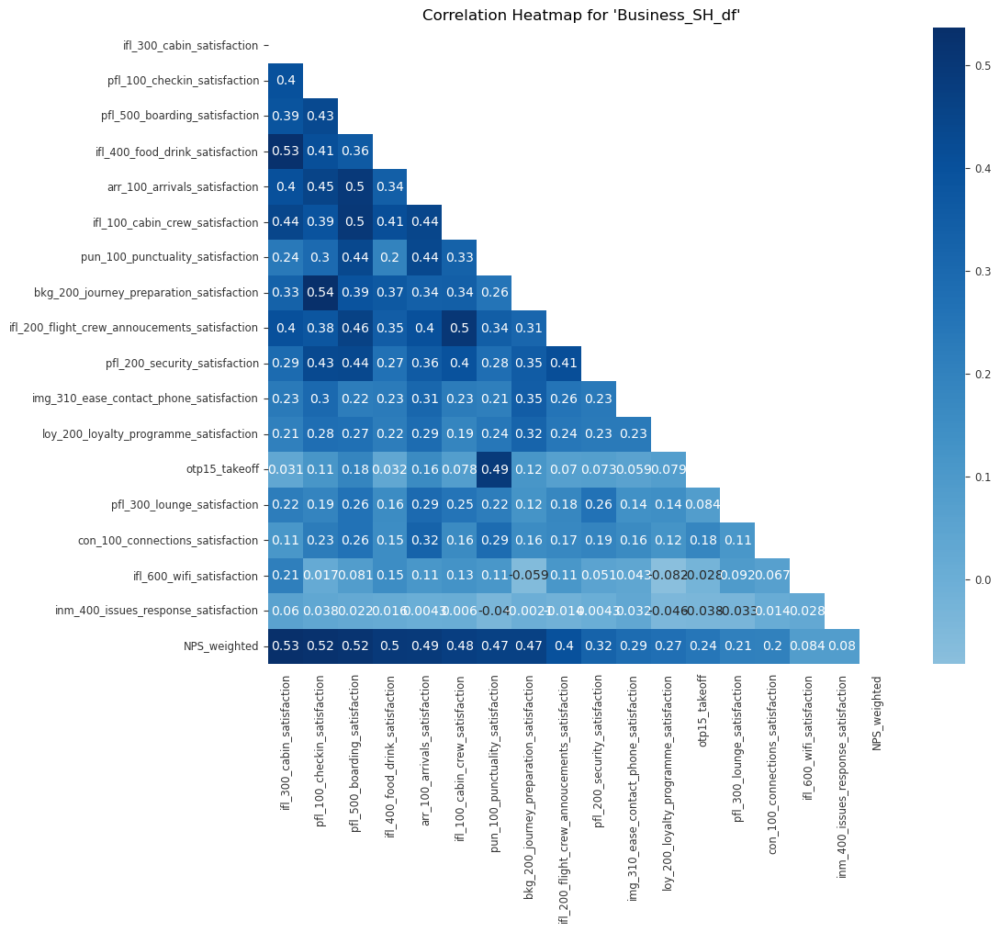

In [50]:
# Get the top correlated features and the correlation matrix for this DataFrame
top_correlated_features, correlation_matrix = get_top_correlated_features(grouped_dfs[key], 17)
    
# Print the top correlated features
print(f"Top correlated features for '{key}': {', '.join(top_correlated_features)}")
    
# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    
# Plot the heatmap
plt.figure(figsize=(11, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="Blues", center=0, mask=mask)
plt.title(f"Correlation Heatmap for '{key}'")
plt.show()

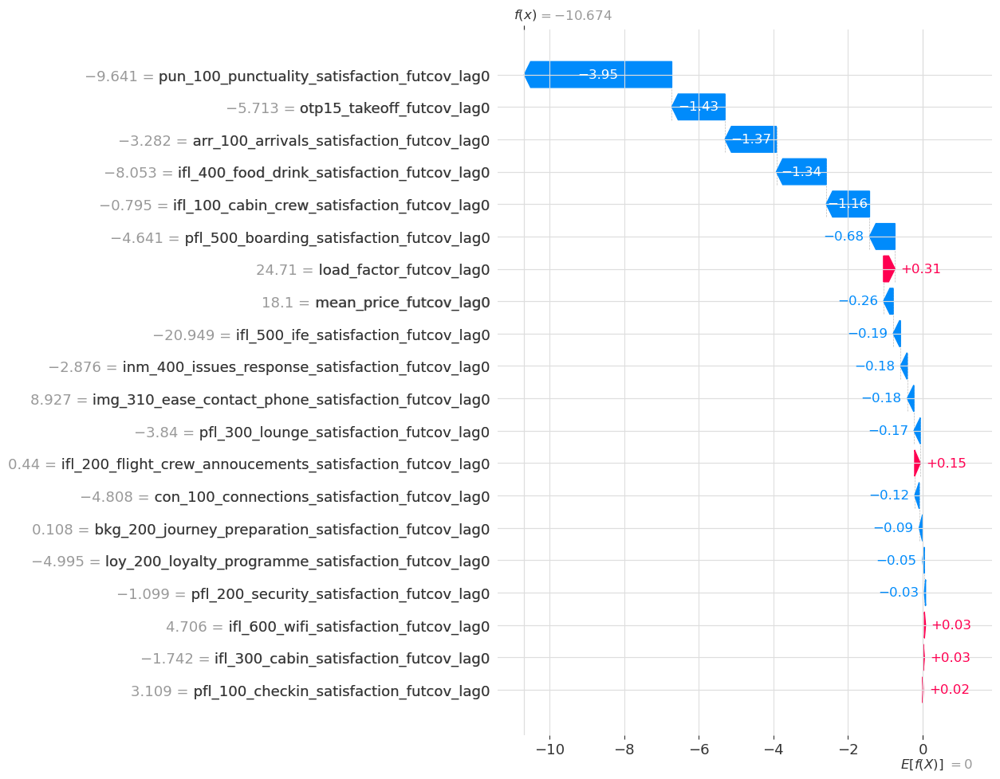

In [51]:
dif_exp=create_difference_explanation(explanation[months_dict['2022/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)


In [52]:
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_22.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

In [53]:
dif_exp=create_difference_explanation(explanation[months_dict['2019/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_19.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

In [95]:
dif_exp=create_difference_explanation(explanation[months_dict['2019/02']],explanation[months_dict['2023/02']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Febrero_23_19.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

In [96]:
dif_exp=create_difference_explanation(explanation[months_dict['2022/02']],explanation[months_dict['2023/02']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Febrero_23_22.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

In [98]:
dif_exp=create_difference_explanation(explanation[months_dict['2019/07']],explanation[months_dict['2023/07']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Julio_23_19.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

In [99]:
dif_exp=create_difference_explanation(explanation[months_dict['2022/07']],explanation[months_dict['2023/07']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Julio_23_22.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

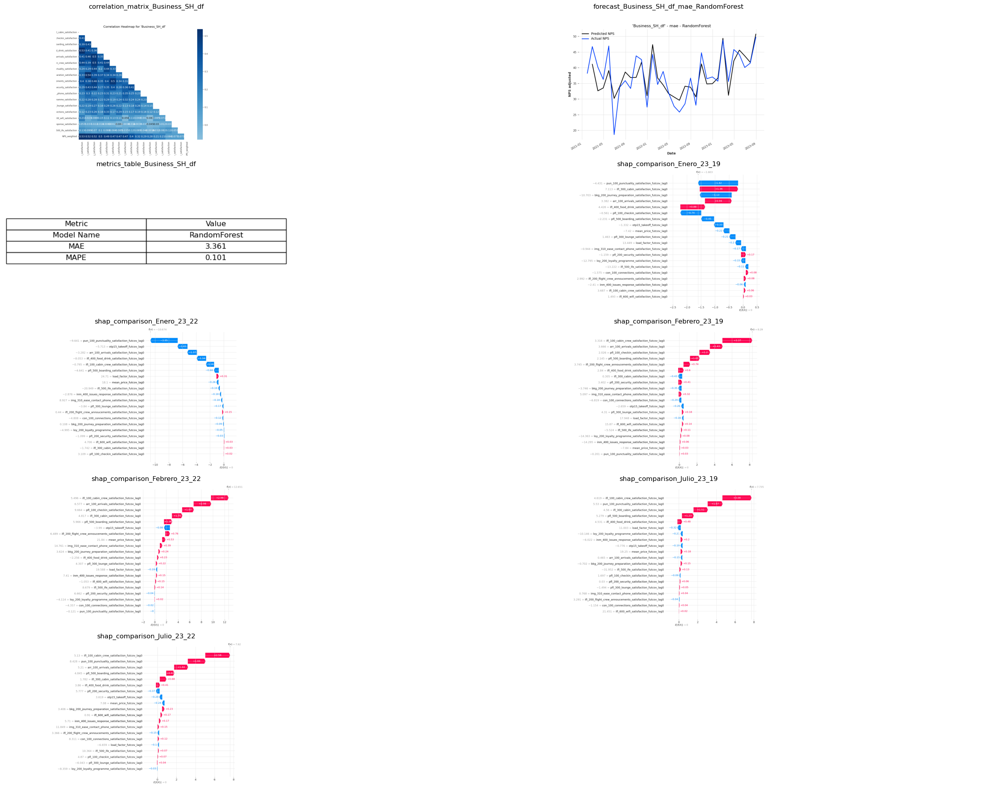

In [100]:
# Example usage:
combine_and_save_plots(f"{output_dir[key]}", f"{key}_report.png")

### Business LH

In [85]:
key='Business_LH_df'
ts=pred_ts_dict_mae[key]
back_ts=nps_ts_dict_mae[key]
exp_df=monthly_grouped_dfs[key]
exp_df['date_flight_local'] = pd.to_datetime(exp_df['date_flight_local'])
exp_df = exp_df.set_index('date_flight_local')

#past_covariates_ts = TimeSeries.from_series(exp_df[lag_features[key]], freq='M')
future_covariates_ts = TimeSeries.from_series(exp_df[features[key]], freq='M')
                
future_scaler = future_scaler_dict_mae[key]
future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)

# Load the pre-trained model
model_file_path = os.path.join(models_dir[key], f"best_mae_model_{key}_RandomForest.pkl")
with open(model_file_path, 'rb') as model_file:
    model = pickle.load(model_file)
    
shap_explain = ShapExplainer(model=model)
shap_explained = shap_explain.explain(ts,foreground_future_covariates=future_covariates_ts_scaled)
explanation=shap_explained.get_shap_explanation_object(horizon=1)

if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    past_lags=best_mae_models_by_dataframe[key]['params']['lags_past_covariates']
future_lags=best_mae_models_by_dataframe[key]['params']['lags_future_covariates']

# Apply the transformation for each lag in past_lags
if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    for lag in past_lags:
        # Select columns for the current lag of past covariates
        current_past_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"pastcov_lag{lag}" in feature]
        # Select data for the current lag of past covariates
        data_for_current_past_covariates = explanation.data[:, current_past_covariates_indices]
    
        # Apply the transformation and store the result
        transformed_past_data = past_scaler.inverse_transform(TimeSeries.from_series(data_for_current_past_covariates)).values()
        explanation.data[:, current_past_covariates_indices] = transformed_past_data

# Apply the transformation for each lag in future_lags
for lag in future_lags:
    # Select columns for the current lag of future covariates
    current_future_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"futcov_lag{lag}" in feature]
    
    # Select data for the current lag of future covariates
    data_for_current_future_covariates = explanation.data[:, current_future_covariates_indices]
    
    # Apply the transformation and store the result
    transformed_future_data = future_scaler.inverse_transform(TimeSeries.from_series(data_for_current_future_covariates)).values()
    
    explanation.data[:, current_future_covariates_indices] = transformed_future_data

Permutation explainer: 33it [00:19,  1.24s/it]                        


In [56]:
shap_explain.force_plot_from_ts(ts,foreground_future_covariates=future_covariates_ts_scaled)

Permutation explainer: 33it [00:18,  1.23s/it]                        


Top correlated features for 'Business_LH_df': ifl_300_cabin_satisfaction, ifl_100_cabin_crew_satisfaction, ifl_400_food_drink_satisfaction, arr_100_arrivals_satisfaction, pfl_500_boarding_satisfaction, pfl_100_checkin_satisfaction, ifl_200_flight_crew_annoucements_satisfaction, bkg_200_journey_preparation_satisfaction, pun_100_punctuality_satisfaction, loy_200_loyalty_programme_satisfaction, ifl_500_ife_satisfaction, pfl_200_security_satisfaction, img_310_ease_contact_phone_satisfaction, pfl_300_lounge_satisfaction, ifl_600_wifi_satisfaction, otp15_takeoff, inm_400_issues_response_satisfaction, con_100_connections_satisfaction, mean_price, load_factor


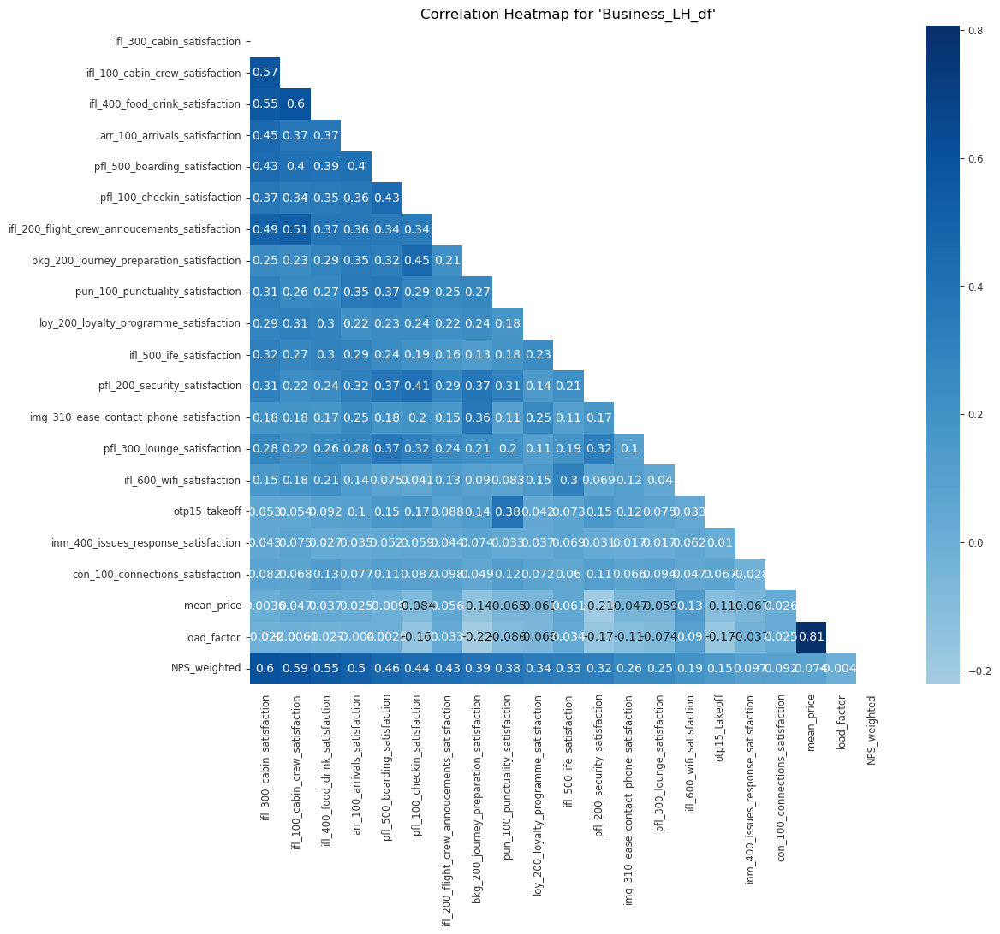

In [92]:
# Get the top correlated features and the correlation matrix for this DataFrame
top_correlated_features, correlation_matrix = get_top_correlated_features(grouped_dfs[key], 30)
    
# Print the top correlated features
print(f"Top correlated features for '{key}': {', '.join(top_correlated_features)}")
    
# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    
# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="Blues", center=0, mask=mask)
plt.title(f"Correlation Heatmap for '{key}'")
plt.show()

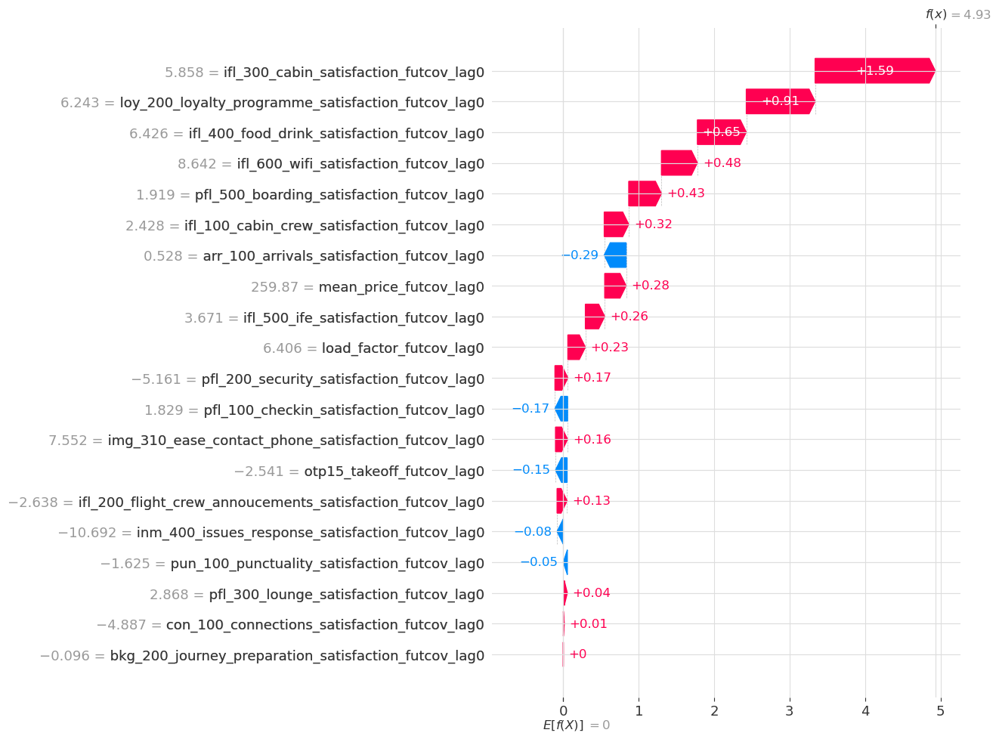

In [86]:
dif_exp=create_difference_explanation(explanation[months_dict['2022/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=30, show=False)

In [87]:
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_22.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()


In [88]:
dif_exp=create_difference_explanation(explanation[months_dict['2019/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_19.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

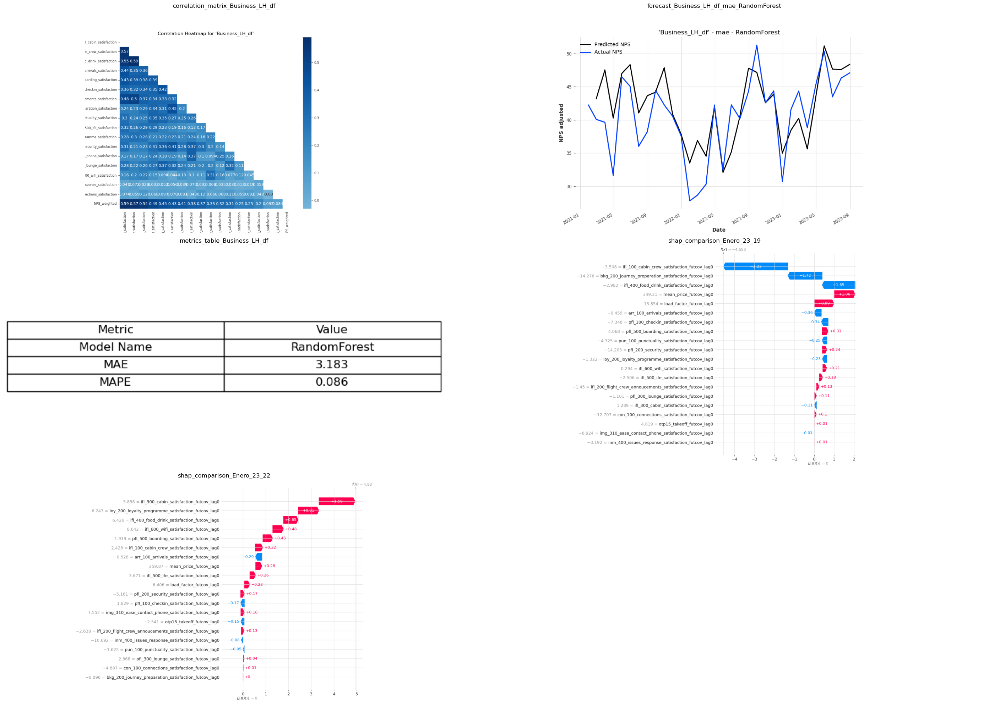

In [91]:
# Example usage:
combine_and_save_plots(f"{output_dir[key]}", f"{key}_report.png")

### Economy SH

In [62]:
key='Economy_SH_df'
ts=pred_ts_dict_mae[key]
back_ts=nps_ts_dict_mae[key]
exp_df=monthly_grouped_dfs[key]
exp_df['date_flight_local'] = pd.to_datetime(exp_df['date_flight_local'])
exp_df = exp_df.set_index('date_flight_local')

#past_covariates_ts = TimeSeries.from_series(exp_df[lag_features[key]], freq='M')
future_covariates_ts = TimeSeries.from_series(exp_df[features[key]], freq='M')
                
future_scaler = future_scaler_dict_mae[key]
future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)

# Load the pre-trained model
model_file_path = os.path.join(models_dir[key], f"best_mae_model_{key}_RandomForest.pkl")
with open(model_file_path, 'rb') as model_file:
    model = pickle.load(model_file)
    
shap_explain = ShapExplainer(model=model)
shap_explained = shap_explain.explain(ts,foreground_future_covariates=future_covariates_ts_scaled)
explanation=shap_explained.get_shap_explanation_object(horizon=1)

if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    past_lags=best_mae_models_by_dataframe[key]['params']['lags_past_covariates']
future_lags=best_mae_models_by_dataframe[key]['params']['lags_future_covariates']

# Apply the transformation for each lag in past_lags
if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    for lag in past_lags:
        # Select columns for the current lag of past covariates
        current_past_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"pastcov_lag{lag}" in feature]
        # Select data for the current lag of past covariates
        data_for_current_past_covariates = explanation.data[:, current_past_covariates_indices]
    
        # Apply the transformation and store the result
        transformed_past_data = past_scaler.inverse_transform(TimeSeries.from_series(data_for_current_past_covariates)).values()
        explanation.data[:, current_past_covariates_indices] = transformed_past_data

# Apply the transformation for each lag in future_lags
for lag in future_lags:
    # Select columns for the current lag of future covariates
    current_future_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"futcov_lag{lag}" in feature]
    
    # Select data for the current lag of future covariates
    data_for_current_future_covariates = explanation.data[:, current_future_covariates_indices]
    
    # Apply the transformation and store the result
    transformed_future_data = future_scaler.inverse_transform(TimeSeries.from_series(data_for_current_future_covariates)).values()
    
    explanation.data[:, current_future_covariates_indices] = transformed_future_data

Permutation explainer: 33it [00:17,  1.24s/it]                        


In [63]:
shap_explain.force_plot_from_ts(ts,foreground_future_covariates=future_covariates_ts_scaled)

Permutation explainer: 33it [00:16,  1.29s/it]                        


Top correlated features for 'Economy_SH_df': pun_100_punctuality_satisfaction, pfl_500_boarding_satisfaction, ifl_100_cabin_crew_satisfaction, arr_100_arrivals_satisfaction, pfl_100_checkin_satisfaction, ifl_200_flight_crew_annoucements_satisfaction, ifl_300_cabin_satisfaction, pfl_200_security_satisfaction, bkg_200_journey_preparation_satisfaction, otp15_takeoff, ifl_400_food_drink_satisfaction, img_310_ease_contact_phone_satisfaction, con_100_connections_satisfaction, loy_200_loyalty_programme_satisfaction, inm_400_issues_response_satisfaction, load_factor, ifl_600_wifi_satisfaction


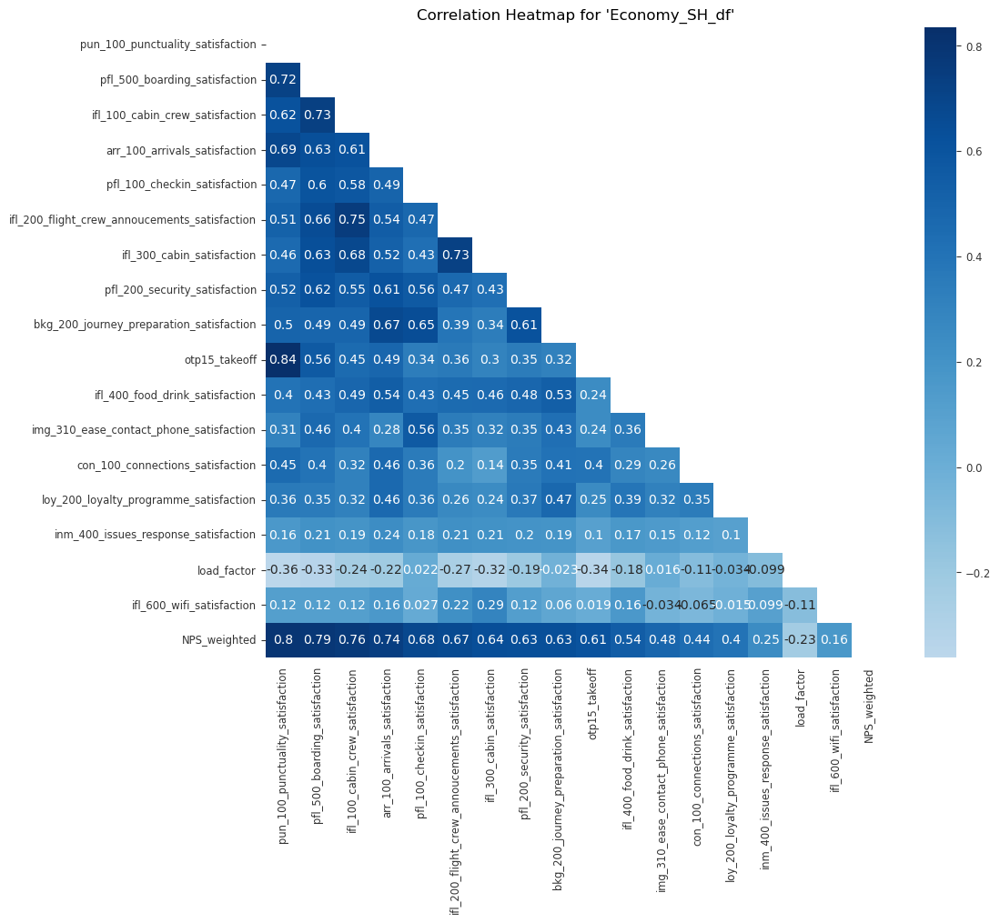

In [64]:
# Get the top correlated features and the correlation matrix for this DataFrame
top_correlated_features, correlation_matrix = get_top_correlated_features(grouped_dfs[key], 17)
    
# Print the top correlated features
print(f"Top correlated features for '{key}': {', '.join(top_correlated_features)}")
    
# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    
# Plot the heatmap
plt.figure(figsize=(11, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="Blues", center=0, mask=mask)
plt.title(f"Correlation Heatmap for '{key}'")
plt.show()

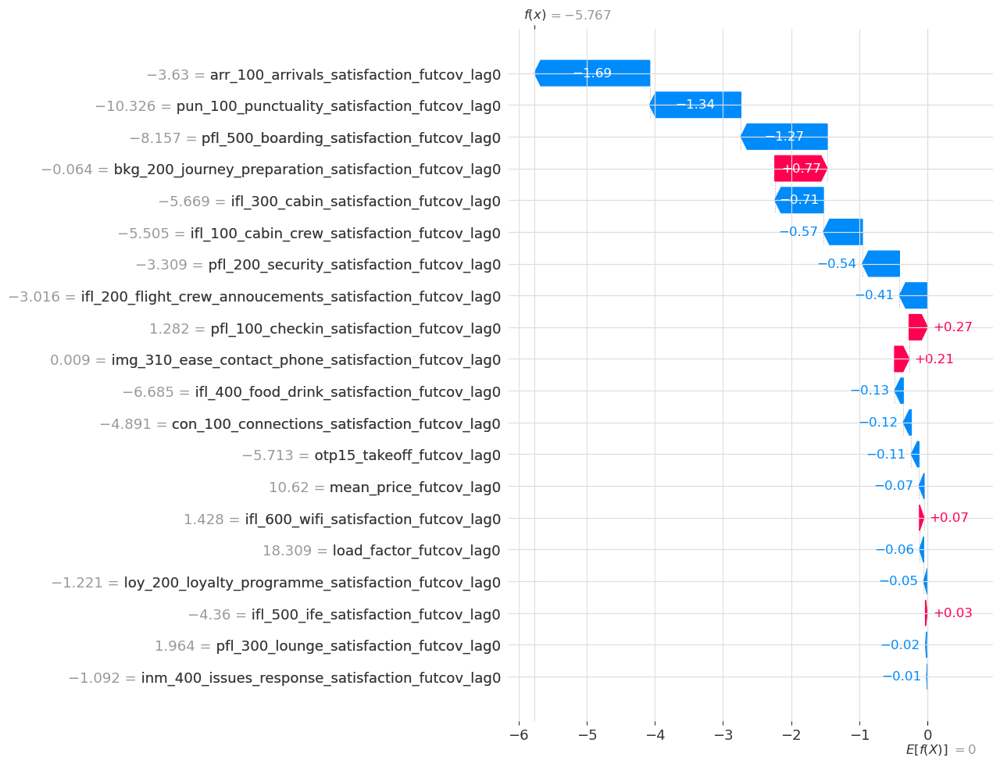

In [65]:
dif_exp=create_difference_explanation(explanation[months_dict['2022/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20, show=False)

In [66]:
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_22.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()



In [67]:
dif_exp=create_difference_explanation(explanation[months_dict['2019/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_19.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

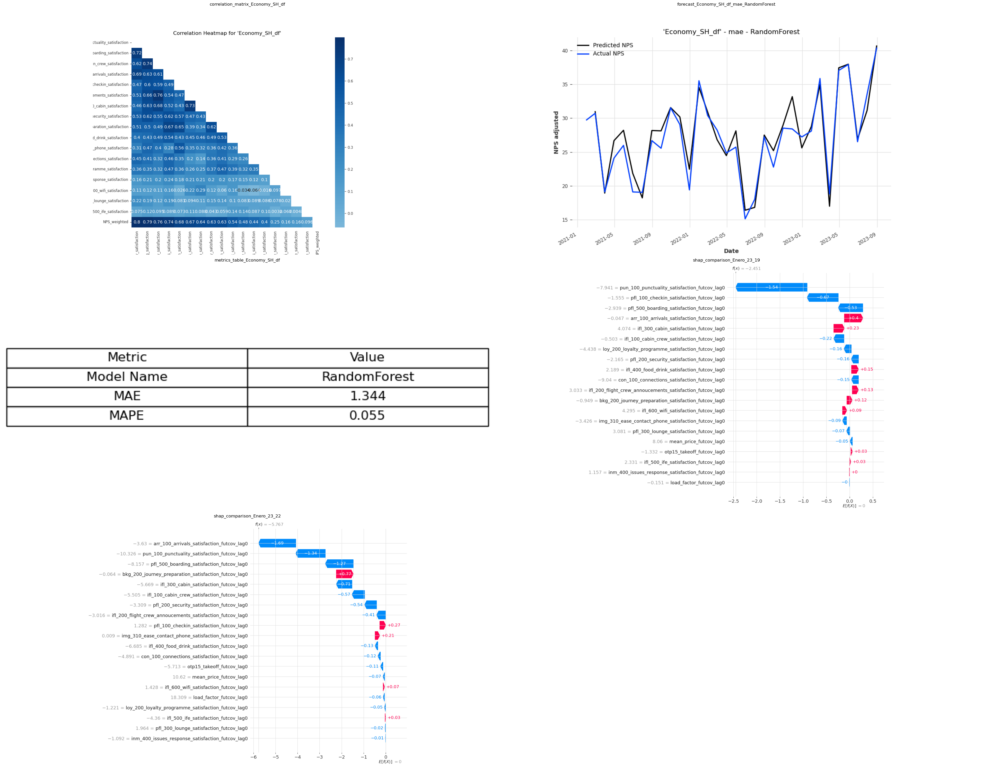

In [68]:
# Example usage:
combine_and_save_plots(f"{output_dir[key]}", f"{key}_report.png")

### Economy LH

In [69]:
key='Economy_LH_df'
ts=pred_ts_dict_mae[key]
back_ts=nps_ts_dict_mae[key]
exp_df=monthly_grouped_dfs[key]
exp_df['date_flight_local'] = pd.to_datetime(exp_df['date_flight_local'])
exp_df = exp_df.set_index('date_flight_local')

#past_covariates_ts = TimeSeries.from_series(exp_df[lag_features[key]], freq='M')
future_covariates_ts = TimeSeries.from_series(exp_df[features[key]], freq='M')
                
future_scaler = future_scaler_dict_mae[key]
future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)

# Load the pre-trained model
model_file_path = os.path.join(models_dir[key], f"best_mae_model_{key}_RandomForest.pkl")
with open(model_file_path, 'rb') as model_file:
    model = pickle.load(model_file)
    
shap_explain = ShapExplainer(model=model)
shap_explained = shap_explain.explain(ts,foreground_future_covariates=future_covariates_ts_scaled)
explanation=shap_explained.get_shap_explanation_object(horizon=1)

if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    past_lags=best_mae_models_by_dataframe[key]['params']['lags_past_covariates']
future_lags=best_mae_models_by_dataframe[key]['params']['lags_future_covariates']

# Apply the transformation for each lag in past_lags
if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    for lag in past_lags:
        # Select columns for the current lag of past covariates
        current_past_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"pastcov_lag{lag}" in feature]
        # Select data for the current lag of past covariates
        data_for_current_past_covariates = explanation.data[:, current_past_covariates_indices]
    
        # Apply the transformation and store the result
        transformed_past_data = past_scaler.inverse_transform(TimeSeries.from_series(data_for_current_past_covariates)).values()
        explanation.data[:, current_past_covariates_indices] = transformed_past_data

# Apply the transformation for each lag in future_lags
for lag in future_lags:
    # Select columns for the current lag of future covariates
    current_future_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"futcov_lag{lag}" in feature]
    
    # Select data for the current lag of future covariates
    data_for_current_future_covariates = explanation.data[:, current_future_covariates_indices]
    
    # Apply the transformation and store the result
    transformed_future_data = future_scaler.inverse_transform(TimeSeries.from_series(data_for_current_future_covariates)).values()
    
    explanation.data[:, current_future_covariates_indices] = transformed_future_data

Permutation explainer: 33it [00:17,  1.19s/it]                        


In [70]:
shap_explain.force_plot_from_ts(ts,foreground_future_covariates=future_covariates_ts_scaled)

Permutation explainer: 33it [00:18,  1.29s/it]                        


Top correlated features for 'Economy_LH_df': ifl_100_cabin_crew_satisfaction, pfl_100_checkin_satisfaction, ifl_300_cabin_satisfaction, bkg_200_journey_preparation_satisfaction, arr_100_arrivals_satisfaction, ifl_400_food_drink_satisfaction, pfl_500_boarding_satisfaction, pun_100_punctuality_satisfaction, pfl_200_security_satisfaction, ifl_200_flight_crew_annoucements_satisfaction, img_310_ease_contact_phone_satisfaction, loy_200_loyalty_programme_satisfaction, otp15_takeoff, con_100_connections_satisfaction, ifl_500_ife_satisfaction, load_factor, mean_price


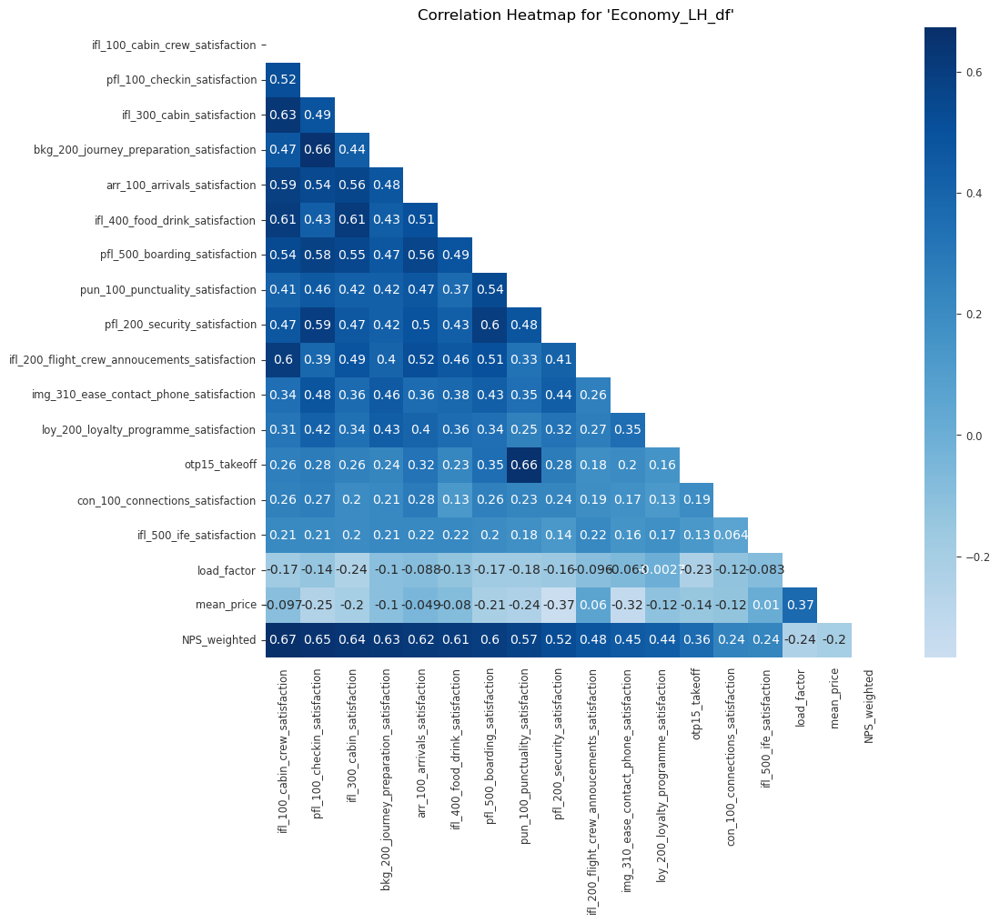

In [71]:
# Get the top correlated features and the correlation matrix for this DataFrame
top_correlated_features, correlation_matrix = get_top_correlated_features(grouped_dfs[key], 17)
    
# Print the top correlated features
print(f"Top correlated features for '{key}': {', '.join(top_correlated_features)}")
    
# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    
# Plot the heatmap
plt.figure(figsize=(11, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="Blues", center=0, mask=mask)
plt.title(f"Correlation Heatmap for '{key}'")
plt.show()

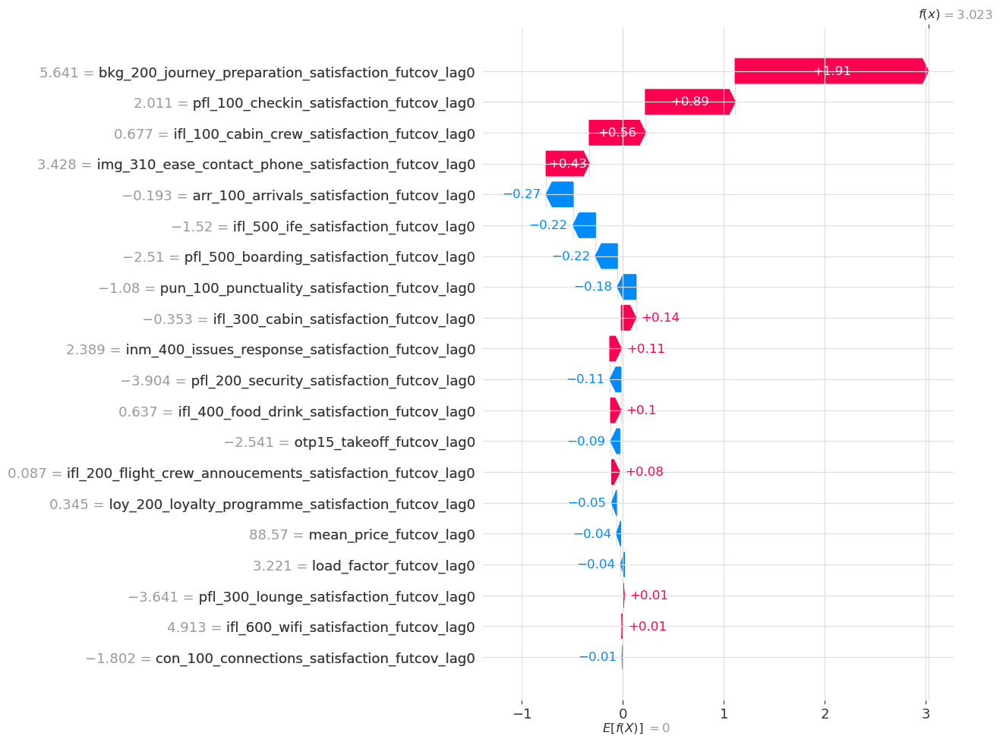

In [72]:
dif_exp=create_difference_explanation(explanation[months_dict['2022/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=30, show=False)

In [73]:
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_22.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

In [74]:
dif_exp=create_difference_explanation(explanation[months_dict['2019/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_19.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

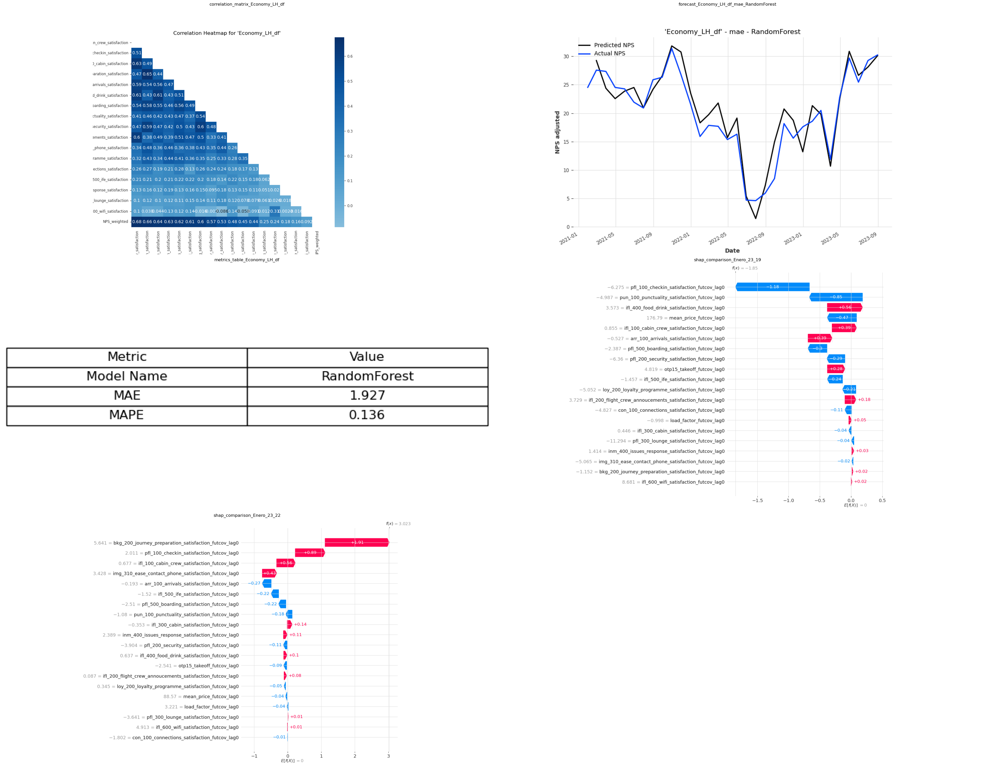

In [75]:
# Example usage:
combine_and_save_plots(f"{output_dir[key]}", f"{key}_report.png")

### Premium Economy

In [76]:
key='Premium Economy_LH_df'
ts=pred_ts_dict_mae[key]
back_ts=nps_ts_dict_mae[key]
exp_df=monthly_grouped_dfs[key]
exp_df['date_flight_local'] = pd.to_datetime(exp_df['date_flight_local'])
exp_df = exp_df.set_index('date_flight_local')

#past_covariates_ts = TimeSeries.from_series(exp_df[lag_features[key]], freq='M')
future_covariates_ts = TimeSeries.from_series(exp_df[features[key]], freq='M')
                
future_scaler = future_scaler_dict_mae[key]
future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)

# Load the pre-trained model
model_file_path = os.path.join(models_dir[key], f"best_mae_model_{key}_RandomForest.pkl")
with open(model_file_path, 'rb') as model_file:
    model = pickle.load(model_file)
    
shap_explain = ShapExplainer(model=model)
shap_explained = shap_explain.explain(ts, foreground_future_covariates=future_covariates_ts_scaled)
explanation=shap_explained.get_shap_explanation_object(horizon=1)

if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    past_lags=best_mae_models_by_dataframe[key]['params']['lags_past_covariates']
future_lags=best_mae_models_by_dataframe[key]['params']['lags_future_covariates']

# Apply the transformation for each lag in past_lags
if 'lags_past_covariates' in best_mae_models_by_dataframe[key]['params'].keys():
    for lag in past_lags:
        # Select columns for the current lag of past covariates
        current_past_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"pastcov_lag{lag}" in feature]
        # Select data for the current lag of past covariates
        data_for_current_past_covariates = explanation.data[:, current_past_covariates_indices]
    
        # Apply the transformation and store the result
        transformed_past_data = past_scaler.inverse_transform(TimeSeries.from_series(data_for_current_past_covariates)).values()
        explanation.data[:, current_past_covariates_indices] = transformed_past_data

# Apply the transformation for each lag in future_lags
for lag in future_lags:
    # Select columns for the current lag of future covariates
    current_future_covariates_indices = [i for i, feature in enumerate(explanation.feature_names) if f"futcov_lag{lag}" in feature]
    
    # Select data for the current lag of future covariates
    data_for_current_future_covariates = explanation.data[:, current_future_covariates_indices]
    
    # Apply the transformation and store the result
    transformed_future_data = future_scaler.inverse_transform(TimeSeries.from_series(data_for_current_future_covariates)).values()
    
    explanation.data[:, current_future_covariates_indices] = transformed_future_data

Permutation explainer: 33it [00:18,  1.25s/it]                        


In [77]:
shap_explain.force_plot_from_ts(ts,foreground_future_covariates=future_covariates_ts_scaled)
# shap_explain.force_plot_from_ts(ts,foreground_past_covariates=past_covariates_ts_scaled,foreground_future_covariates=future_covariates_ts_scaled)

Permutation explainer: 33it [00:18,  1.23s/it]                        


Top correlated features for 'Premium Economy_LH_df': ifl_100_cabin_crew_satisfaction, ifl_300_cabin_satisfaction, ifl_400_food_drink_satisfaction, pfl_100_checkin_satisfaction, pfl_500_boarding_satisfaction, ifl_200_flight_crew_annoucements_satisfaction, pun_100_punctuality_satisfaction, arr_100_arrivals_satisfaction, bkg_200_journey_preparation_satisfaction, loy_200_loyalty_programme_satisfaction, pfl_200_security_satisfaction, ifl_500_ife_satisfaction, img_310_ease_contact_phone_satisfaction, con_100_connections_satisfaction, otp15_takeoff, load_factor, ifl_600_wifi_satisfaction


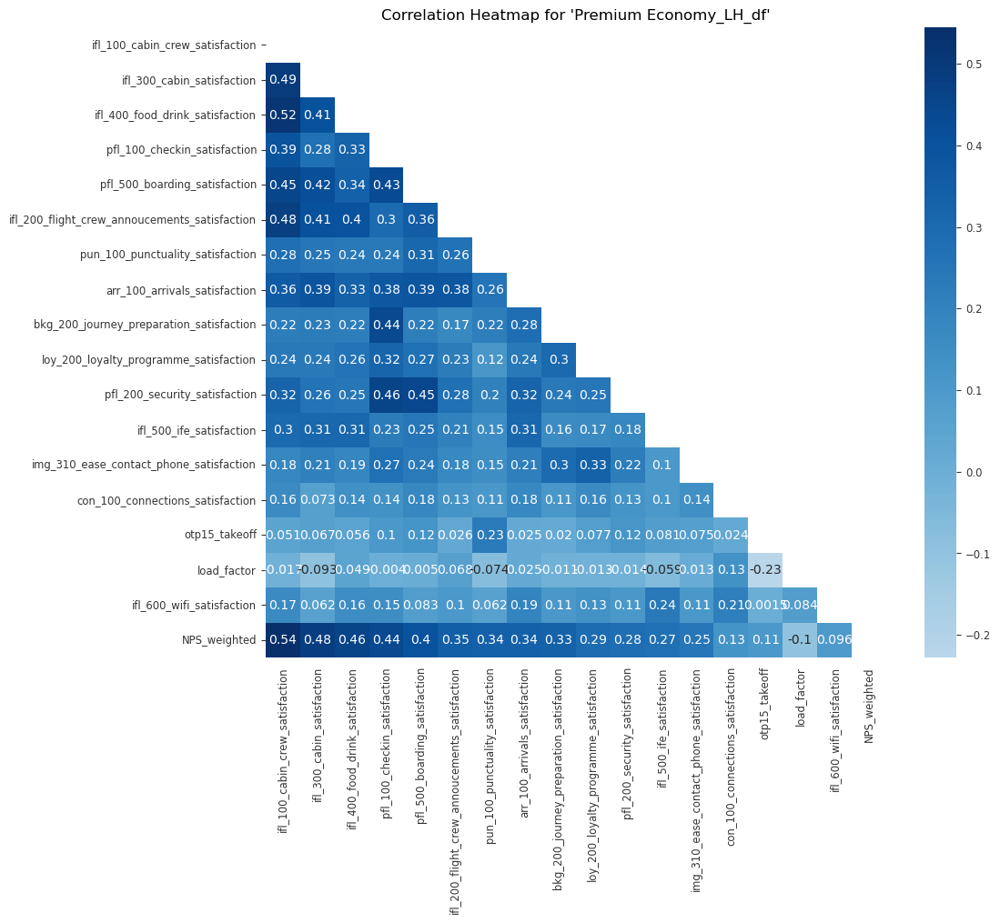

In [78]:
# Get the top correlated features and the correlation matrix for this DataFrame
top_correlated_features, correlation_matrix = get_top_correlated_features(grouped_dfs[key], 17)
    
# Print the top correlated features
print(f"Top correlated features for '{key}': {', '.join(top_correlated_features)}")
    
# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    
# Plot the heatmap
plt.figure(figsize=(11, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="Blues", center=0, mask=mask)
plt.title(f"Correlation Heatmap for '{df_id}'")
plt.show()

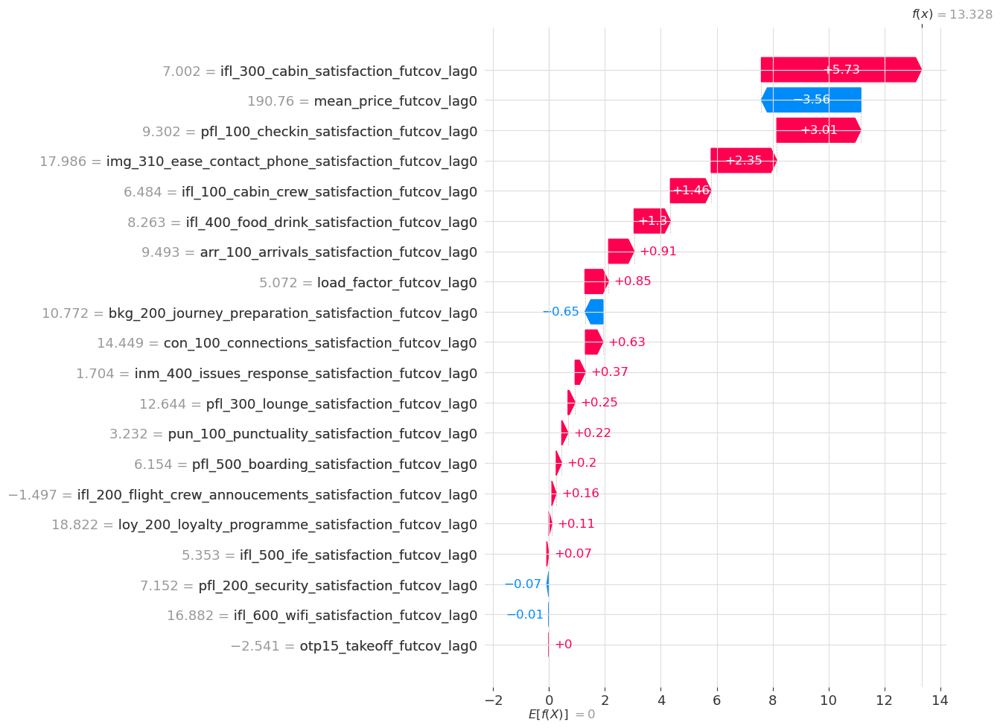

In [79]:
dif_exp=create_difference_explanation(explanation[months_dict['2022/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=30, show=False)

In [80]:
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_22.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

In [81]:
dif_exp=create_difference_explanation(explanation[months_dict['2019/01']],explanation[months_dict['2023/01']])
shap.plots.waterfall(shap_values=dif_exp, max_display=20,show=False)
# Define the output file path
output_file_path = f"{output_dir[key]}/shap_comparison_Enero_23_19.png"

# Save the SHAP plot to the specified location
plt.savefig(output_file_path, bbox_inches='tight')

# Close the plot to release resources
plt.close()

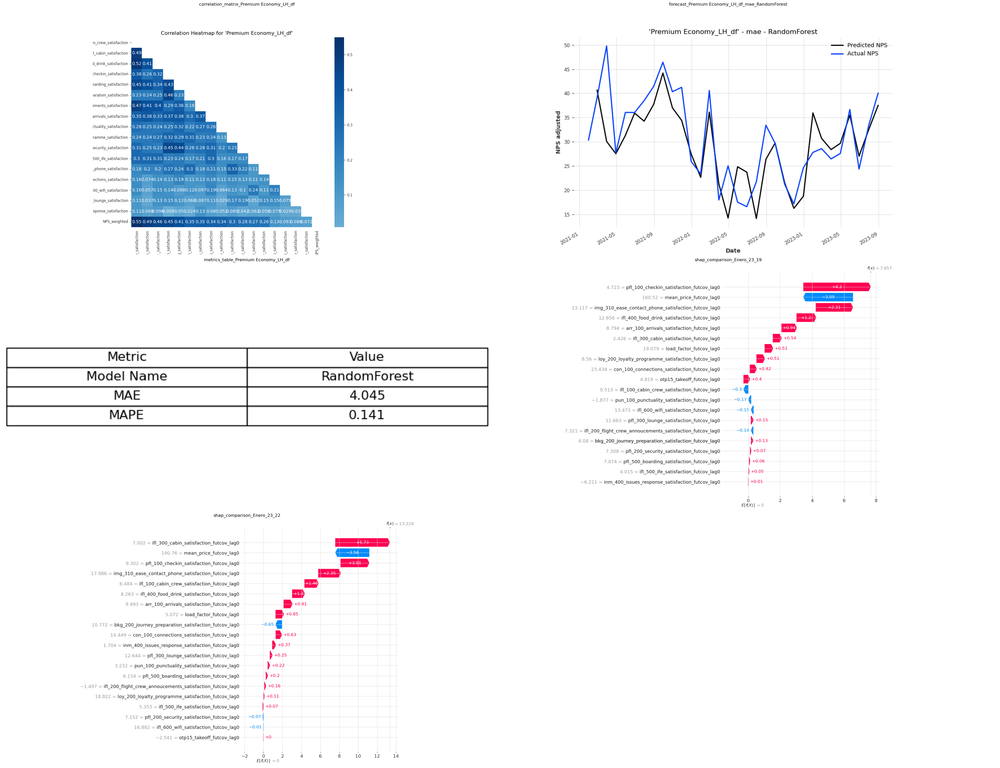

In [82]:
# Example usage:
combine_and_save_plots(f"{output_dir[key]}", f"{key}_report.png")

# Backlock

In [ ]:

shaps={}

def run_shapley_values_mae(models_by_dataframe, nps_ts_dict, output_dir):
    for df_id, value in models_by_dataframe.items():
        model_name = value['model_name']
        model_params = value['params']
        pred_series = value['pred_series']

        df=grouped_dfs[df_id]
        df['date'] = pd.to_datetime(df['date_flight_local'])
        df = df.set_index('date')
        df = df.fillna(0)
        
        train_ts,val_ts = nps_ts_dict[df_id][:-12],nps_ts_dict[df_id][-12:]

        past_covariates_ts = TimeSeries.from_series(df[lag_features[df_id]], freq='M')
        future_covariates_ts = TimeSeries.from_series(df[features[df_id]], freq='M')
                
        train_past_covariates_ts,val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
        train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6]  , future_covariates_ts[-6:]
        
        nps_scaler = Scaler()
        nps_scaler.fit(train_ts)
        nps_ts_dict_scaled = nps_scaler.transform(nps_ts_dict[key])
        train_ts_scaled=nps_scaler.transform(train_ts)
        val_ts_scaled= nps_scaler.transform(val_ts)
        pred_series_scaled=nps_scaler.transform(pred_series)
                
        past_scaler = Scaler()
        past_scaler.fit(train_past_covariates_ts)
        past_covariates_ts_scaled=past_scaler.transform(past_covariates_ts)
        train_past_covariates_ts_scaled = past_scaler.transform(train_past_covariates_ts)
        val_past_covariates_ts_scaled=past_scaler.transform(val_past_covariates_ts)        
                
        future_scaler = Scaler()
        future_scaler.fit(train_future_covariates_ts)
        future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)
        train_future_covariates_ts_scaled=future_scaler.transform(train_future_covariates_ts)
        val_future_covariates_ts_scaled=future_scaler.transform(val_future_covariates_ts)
    
        # Load the pre-trained model
        model_file_path = os.path.join('best_models_Adjusted_NPS', f"best_mae_model_{df_id}_{model_name}.pkl")
        with open(model_file_path, 'rb') as model_file:
            model = pickle.load(model_file)
            
        if "lags_past_covariates" in model_params:
            # Compute Shapley values
            shap_explain = ShapExplainer(model=model, background_series = train_ts_scaled, background_future_covariates = train_future_covariates_ts_scaled, background_past_covariates = train_past_covariates_ts_scaled)
            shaps[key] = shap_explain.explain(foreground_series=pred_series_scaled,foreground_future_covariates=val_future_covariates_ts_scaled, foreground_past_covariates= val_past_covariates_ts_scaled)
        else:
            # Compute Shapley values
            shap_explain = ShapExplainer(model=model, background_series = train_ts_scaled, background_future_covariates = train_future_covariates_ts_scaled)
            shaps[key] = shap_explain.explain(foreground_series=pred_series_scaled,foreground_future_covariates=val_future_covariates_ts_scaled)
            
        print(shaps[key])
        

# Run the Shapley value computation and create plots
run_shapley_values_mae(best_mae_models_by_dataframe, nps_ts_dict_mae, output_dir)


In [ ]:

from darts.models import LightGBMModel, RandomForest, LinearRegressionModel
from darts.utils.statistics import check_seasonality, plot_acf, plot_residuals_analysis

from darts.explainability.shap_explainer import ShapExplainer
shaps={}
output={}
feature_values={}
shap_objects={}

def run_shapley_values_mae(models_by_dataframe, nps_ts_dict, output_dir):
    for df_id, value in models_by_dataframe.items():
        model_name = value['model_name']
        model_params = value['params']
        pred_series = value['pred_series']

        df=grouped_dfs[df_id]
        df['date'] = pd.to_datetime(df['date_flight_local'])
        df = df.set_index('date')
        df = df.fillna(0)
        
        train_ts,val_ts = nps_ts_dict[df_id][:-12],nps_ts_dict[df_id][-12:]

        past_covariates_ts = TimeSeries.from_series(df[lag_features[df_id]], freq='M')
        future_covariates_ts = TimeSeries.from_series(df[features[df_id]], freq='M')
                
        train_past_covariates_ts,val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
        train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6]  , future_covariates_ts[-6:]
        
        nps_scaler = Scaler()
        nps_scaler.fit(train_ts)
        nps_ts_dict_scaled = nps_scaler.transform(nps_ts_dict[key])
        train_ts_scaled=nps_scaler.transform(train_ts)
        val_ts_scaled= nps_scaler.transform(val_ts)
        pred_series_scaled=nps_scaler.transform(pred_series)
                
        past_scaler = Scaler()
        past_scaler.fit(train_past_covariates_ts)
        past_covariates_ts_scaled=past_scaler.transform(past_covariates_ts)
        train_past_covariates_ts_scaled = past_scaler.transform(train_past_covariates_ts)
        val_past_covariates_ts_scaled=past_scaler.transform(val_past_covariates_ts)        
                
        future_scaler = Scaler()
        future_scaler.fit(train_future_covariates_ts)
        future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)
        train_future_covariates_ts_scaled=future_scaler.transform(train_future_covariates_ts)
        val_future_covariates_ts_scaled=future_scaler.transform(val_future_covariates_ts)
    
        # Load the pre-trained model
        model_file_path = os.path.join('best_models_Adjusted_NPS', f"best_mae_model_{df_id}_{model_name}.pkl")
        with open(model_file_path, 'rb') as model_file:
            model = pickle.load(model_file)
            
        if "lags_past_covariates" in model_params:
            # Compute Shapley values
            shap_explain = ShapExplainer(model=model, background_series = train_ts_scaled, background_future_covariates = train_future_covariates_ts_scaled, background_past_covariates = train_past_covariates_ts_scaled)
            shaps[df_id] = shap_explain.explain(foreground_series=pred_series_scaled,foreground_future_covariates=val_future_covariates_ts_scaled, foreground_past_covariates= val_past_covariates_ts_scaled)
        else:
            # Compute Shapley values
            shap_explain = ShapExplainer(model=model, background_series = train_ts_scaled, background_future_covariates = train_future_covariates_ts_scaled)
            shaps[df_id] = shap_explain.explain(foreground_series=pred_series_scaled,foreground_future_covariates=val_future_covariates_ts_scaled)
            
        print(shaps[df_id])        
        output[df_id] = shaps[df_id].get_explanation(horizon=1, component="NPS_weighted")
        feature_values[df_id] = shaps[df_id].get_feature_values(horizon=1, component="NPS_weighted")
        shap_objects[df_id] = shaps[df_id].get_shap_explanation_object(horizon=1, component="NPS_weighted")
        

# Run the Shapley value computation and create plots
run_shapley_values_mae(best_mae_models_by_dataframe, nps_ts_dict_mae, output_dir)

In [ ]:
import pickle
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from darts.models import LinearRegressionModel, LightGBMModel, RandomForest
def train_and_save_best_mae_models(models, model_params_list, grouped_dfs, output_dir, model_save_dir):
    best_models_by_dataframe = {}

    nps_ts_dict = {}  # Create an empty dictionary to store nps_ts for each dataframe
    
    for model_name in models:
        for model_params in model_params_list:
            for key in grouped_dfs.keys():
                df = grouped_dfs[key]
                df['date'] = pd.to_datetime(df['date_flight_local'])
                df = df.set_index('date')
                df = df.fillna(0)
                nps_ts_dict[key] = TimeSeries.from_series(df['NPS_weighted'], freq='M')                  
                train_ts, val_ts = nps_ts_dict[key][:-6], nps_ts_dict[key][-6:]

                past_covariates_ts = TimeSeries.from_series(df[lag_features[key]], freq='M')
                future_covariates_ts = TimeSeries.from_series(df[features[key]], freq='M')
                
                train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
                train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6], future_covariates_ts[-6:]  
                
                nps_scaler = Scaler()
                nps_scaler.fit(train_ts)
                train_ts_scaled = nps_scaler.transform(train_ts)
                
                past_scaler = Scaler()
                past_scaler.fit(train_past_covariates_ts)
                past_covariates_ts_scaled = past_scaler.transform(past_covariates_ts)                
                train_past_covariates_ts_scaled = past_scaler.transform(train_past_covariates_ts)
                
                future_scaler = Scaler()
                future_scaler.fit(train_future_covariates_ts)
                future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)
                train_future_covariates_ts_scaled = future_scaler.transform(train_future_covariates_ts)

                if model_name == 'LightGBMModel':
                    model = LightGBMModel(**model_params)
                elif model_name == 'RandomForest':
                    model = RandomForest(**model_params)
                elif model_name == 'LinearRegressionModel':
                    model = LinearRegressionModel(**model_params)
                else:
                    raise ValueError(f"Unknown model name: {model_name}")
                
                if "lags_past_covariates" in model_params.keys():
                    model.fit(train_ts_scaled, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts)
                    pred_series_scaled = model.predict(n=6, series=train_ts_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled)
                else:
                    model.fit(train_ts_scaled, future_covariates=train_future_covariates_ts_scaled)
                    pred_series_scaled = model.predict(n=6, series=train_ts_scaled, future_covariates=future_covariates_ts_scaled)
                    
                pred_series = nps_scaler.inverse_transform(pred_series_scaled)
                mae = mean_absolute_error(val_ts.values(), pred_series.values())
                mape = mean_absolute_percentage_error(val_ts.values(), pred_series.values())

                if key not in best_models_by_dataframe or mae < best_models_by_dataframe[key]['mae']:
                    best_models_by_dataframe[key] = {
                        'model_name': model_name,
                        'mae': mae,
                        'mape': mape,
                        'params': model_params,
                        'pred_series': pred_series,
                        'model': model  # Save the model instance in the dictionary
                    }

    # Save the best models after all loops
    for df_id, value in best_models_by_dataframe.items():
        best_model_path = os.path.join(model_save_dir, f"best_mae_model_{df_id}_{value['model_name']}.pkl")
        with open(best_model_path, 'wb') as model_file:
            pickle.dump(value['model'], model_file)

    for df_id, value in best_models_by_dataframe.items():
        plt.figure(figsize=(10, 6))
        value['pred_series'].plot(label='Predicted NPS')
        nps_ts_dict[df_id].plot(label='Actual NPS')  # Use the correct nps_ts for each dataframe
        plt.title(f"'{df_id}' - mae - {value['model_name']}")
        plt.xlabel("Date")
        plt.ylabel("NPS adjusted")
        plt.legend()
        plt.savefig(f"{output_dir}/forecast_{df_id}_mae_{value['model_name']}.png")
        plt.close()

    return best_models_by_dataframe, nps_ts_dict

# Assuming you have the grouped_dfs dictionary defined
best_mae_models_by_dataframe, nps_ts_dict_mae = train_and_save_best_mae_models(models, model_params, grouped_dfs, output_dir, models_dir)
import pickle
def train_and_save_best_mape_models(models, model_params_list, grouped_dfs, output_dir, model_save_dir):
    best_models_by_dataframe = {}

    nps_ts_dict = {}  # Create an empty dictionary to store nps_ts for each dataframe
    
    for model_name in models:
        for model_params in model_params_list:
            for key in grouped_dfs.keys():
                df = grouped_dfs[key]
                df['date'] = pd.to_datetime(df['date_flight_local'])
                df = df.set_index('date')
                df = df.fillna(0)
                
                nps_ts_dict[key] = TimeSeries.from_series(df['NPS_weighted'], freq='M')                  
                train_ts, val_ts = nps_ts_dict[key][:-6], nps_ts_dict[key][-6:]

                past_covariates_ts = TimeSeries.from_series(df[lag_features[key]], freq='M')
                future_covariates_ts = TimeSeries.from_series(df[features[key]], freq='M')
                
                train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
                train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6], future_covariates_ts[-6:]  
                
                nps_scaler = Scaler()
                nps_scaler.fit(train_ts)
                train_ts_scaled = nps_scaler.transform(train_ts)
                
                past_scaler = Scaler()
                past_scaler.fit(train_past_covariates_ts)
                past_covariates_ts_scaled = past_scaler.transform(past_covariates_ts)                
                train_past_covariates_ts_scaled = past_scaler.transform(train_past_covariates_ts)
                
                future_scaler = Scaler()
                future_scaler.fit(train_future_covariates_ts)
                future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)
                train_future_covariates_ts_scaled = future_scaler.transform(train_future_covariates_ts)

                if model_name == 'LightGBMModel':
                    model = LightGBMModel(**model_params)
                elif model_name == 'RandomForest':
                    model = RandomForest(**model_params)
                elif model_name == 'LinearRegressionModel':
                    model = LinearRegressionModel(**model_params)
                else:
                    raise ValueError(f"Unknown model name: {model_name}")

                if "lags_past_covariates" in model_params.keys():
                    model.fit(train_ts_scaled, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts)
                    pred_series_scaled = model.predict(n=6, series=train_ts_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled)
                else:
                    model.fit(train_ts_scaled, future_covariates=train_future_covariates_ts)
                    pred_series_scaled = model.predict(n=6, series=train_ts_scaled, future_covariates=future_covariates_ts_scaled)
                
                pred_series = nps_scaler.inverse_transform(pred_series_scaled)
                mae = mean_absolute_error(val_ts.values(), pred_series.values())
                mape = mean_absolute_percentage_error(val_ts.values(), pred_series.values())

                if key not in best_models_by_dataframe or mape < best_models_by_dataframe[key]['mape']:
                    best_models_by_dataframe[key] = {
                        'model_name': model_name,
                        'mae': mae,
                        'mape': mape,
                        'params': model_params,
                        'pred_series': pred_series,
                        'model': model  # Save the model instance in the dictionary
                    }

    # Save the best models after all loops
    for df_id, value in best_models_by_dataframe.items():
        best_model_path = os.path.join(model_save_dir, f"best_mape_model_{df_id}_{value['model_name']}.pkl")
        with open(best_model_path, 'wb') as model_file:
            pickle.dump(value['model'], model_file)

    for df_id, value in best_models_by_dataframe.items():
        plt.figure(figsize=(10, 6))
        value['pred_series'].plot(label='Predicted NPS')
        nps_ts_dict[df_id].plot(label='Actual NPS')  # Use the correct nps_ts for each dataframe
        plt.title(f"'{df_id}' - mape - {value['model_name']}")
        plt.xlabel("Date")
        plt.ylabel("NPS ajusted")
        plt.legend()
        plt.savefig(f"{output_dir}/forecast_{df_id}_mape_{value['model_name']}.png")
        plt.close()

    return best_models_by_dataframe, nps_ts_dict

# Assuming you have the grouped_dfs dictionary defined
best_mape_models_by_dataframe, nps_ts_dict_mape = train_and_save_best_mape_models(models, model_params, grouped_dfs, output_dir, models_dir)

def run_backtest_mape(models_by_dataframe, nps_ts_dict, output_dir):
    for df_id, value in models_by_dataframe.items():
        model_name = value['model_name']
        model_params = value['params']
        pred_series = value['pred_series']

        df=grouped_dfs[df_id]
        df['date'] = pd.to_datetime(df['date_flight_local'])
        df = df.set_index('date')
        df = df.fillna(0)
        
        train_ts = nps_ts_dict[df_id][:-6]

        past_covariates_ts = TimeSeries.from_series(df[lag_features[df_id]], freq='M')
        future_covariates_ts = TimeSeries.from_series(df[features[df_id]], freq='M')
                
        train_past_covariates_ts = past_covariates_ts[:-6]
        train_future_covariates_ts = future_covariates_ts[:-6]  
        
        nps_scaler = Scaler()
        nps_scaler.fit(train_ts)
        nps_ts_dict_scaled = nps_scaler.transform(train_ts)
                
        past_scaler = Scaler()
        past_scaler.fit(train_past_covariates_ts)
        past_covariates_ts_scaled = past_scaler.transform(past_covariates_ts)                
                
        future_scaler = Scaler()
        future_scaler.fit(train_future_covariates_ts)
        future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)

        # Load the pre-trained model
        model_file_path = os.path.join('best_models_Adjusted_NPS', f"best_mape_model_{df_id}_{model_name}.pkl")
        with open(model_file_path, 'rb') as model_file:
            model = pickle.load(model_file)

        
        if "lags_past_covariates" in model_params:
            # Run the backtest
            backtest_scaled = model.historical_forecasts(
                nps_ts_dict_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled, start=None, forecast_horizon=6, verbose=True, retrain = False 
            )
        else:
            # Run the backtest
            backtest_scaled = model.historical_forecasts(
                nps_ts_dict_scaled, future_covariates=future_covariates_ts_scaled, start=None, forecast_horizon=6, verbose=True, retrain = False
            )
        
        backtest=nps_scaler.inverse_transform(backtest_scaled)
        print(f"Backtest MAE for '{df_id}' using {model_name}: %.2f" % (mae(backtest, nps_ts_dict[df_id])))
        print(f"Backtest MAPE for '{df_id}' using {model_name}: %.2f" % (mape(backtest, nps_ts_dict[df_id])))
        
        # Plot the results
        plt.figure(figsize=(10, 6))
        pred_series.plot(label='Predicted NPS')
        nps_ts_dict[df_id].plot(label='Actual NPS')
        backtest.plot(label='Backtest NPS Forecast')
        plt.title(f"'{df_id}' - {model_name} - Backtest")
        plt.xlabel("Date")
        plt.ylabel("NPS adjusted")
        plt.legend()
        plt.savefig(f"{output_dir}/mape_backtest_{df_id}_{model_name}.png")
        plt.close()

        
        # Run the backtest for best MAPE models
run_backtest_mape(best_mape_models_by_dataframe, nps_ts_dict_mape, output_dir)

## Tuning

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, HuberRegressor, PassiveAggressiveRegressor, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.linear_model import TheilSenRegressor, PoissonRegressor, GammaRegressor

regression_models = [
    LinearRegression(), Lasso(), ElasticNet(), HuberRegressor(), PassiveAggressiveRegressor(), SGDRegressor(),
    Ridge(),
    DecisionTreeRegressor(),
    RandomForestRegressor(), GradientBoostingRegressor(), BaggingRegressor(), AdaBoostRegressor(),
    SVR(),
    KNeighborsRegressor(),
    GaussianProcessRegressor(),
    TheilSenRegressor(), PoissonRegressor()
]


import pickle
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from darts.models import RegressionModel
def train_and_save_best_mae_models(models, model_params_list, grouped_dfs, output_dir, model_save_dir):
    best_models_by_dataframe = {}
    model={}

    nps_ts_dict = {}  # Create an empty dictionary to store nps_ts for each dataframe
    
    for model_name in models:
        for model_params in model_params_list:
            for key in grouped_dfs.keys():
                df = grouped_dfs[key]
                df['date'] = pd.to_datetime(df['date_flight_local'])
                df = df.set_index('date')
                df = df.fillna(0)
                nps_ts_dict[key] = TimeSeries.from_series(df['NPS_weighted'], freq='M')                  
                train_ts, val_ts = nps_ts_dict[key][:-6], nps_ts_dict[key][-6:]

                past_covariates_ts = TimeSeries.from_series(df[lag_features[key]], freq='M')
                future_covariates_ts = TimeSeries.from_series(df[features[key]], freq='M')
                
                train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
                train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6], future_covariates_ts[-6:]  
                
                model[key]=RegressionModel(model=model_name, **model_params)
                
                nps_scaler = Scaler()
                nps_scaler.fit(train_ts)
                train_ts_scaled = nps_scaler.transform(train_ts)
                
                past_scaler = Scaler()
                past_scaler.fit(train_past_covariates_ts)
                past_covariates_ts_scaled = past_scaler.transform(past_covariates_ts)                
                train_past_covariates_ts_scaled = past_scaler.transform(train_past_covariates_ts)
                
                future_scaler = Scaler()
                future_scaler.fit(train_future_covariates_ts)
                future_covariates_ts_scaled = future_scaler.transform(future_covariates_ts)
                train_future_covariates_ts_scaled = future_scaler.transform(train_future_covariates_ts)
                
                if "lags_past_covariates" in model_params.keys():
                    model[key].fit(train_ts_scaled, future_covariates=train_future_covariates_ts_scaled, past_covariates=train_past_covariates_ts_scaled)
                    pred_series_scaled = model[key].predict(n=6, series=train_ts_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled)
                else:
                    model[key].fit(train_ts_scaled, future_covariates=train_future_covariates_ts_scaled)
                    pred_series_scaled = model[key].predict(n=6, series=train_ts_scaled, future_covariates=future_covariates_ts_scaled)
                    
                pred_series = nps_scaler.inverse_transform(pred_series_scaled)
                mae = mean_absolute_error(val_ts.values(), pred_series.values())
                mape = mean_absolute_percentage_error(val_ts.values(), pred_series.values())

                if key not in best_models_by_dataframe or mae < best_models_by_dataframe[key]['mae']:
                    best_models_by_dataframe[key] = {
                        'model_name': model_name,
                        'mae': mae,
                        'mape': mape,
                        'params': model_params,
                        'pred_series': pred_series,
                        'model': model[key]  # Save the model instance in the dictionary
                    }

    # Save the best models after all loops
    for df_id, value in best_models_by_dataframe.items():
        best_model_path = os.path.join(model_save_dir, f"best_mae_model_{df_id}_{value['model_name']}.pkl")
        with open(best_model_path, 'wb') as model_file:
            pickle.dump(value['model'], model_file)

    for df_id, value in best_models_by_dataframe.items():
        plt.figure(figsize=(10, 6))
        value['pred_series'].plot(label='Predicted NPS')
        nps_ts_dict[df_id].plot(label='Actual NPS')  # Use the correct nps_ts for each dataframe
        plt.title(f"'{df_id}' - mae - {value['model_name']}")
        plt.xlabel("Date")
        plt.ylabel("NPS adjusted")
        plt.legend()
        plt.savefig(f"{output_dir}/forecast_{df_id}_mae_{value['model_name']}.png")
        plt.close()

    return best_models_by_dataframe, nps_ts_dict

# Assuming you have the grouped_dfs dictionary defined
best_mae_models_by_dataframe, nps_ts_dict_mae = train_and_save_best_mae_models(regression_models, model_params, grouped_dfs, output_dir, models_dir)

In [ ]:
output_dir = "tuning_Adjusted_NPS"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [ ]:
models = ['LinearRegressionModel']
add_encoders = {
    'cyclic': {'future': ['month']},
    'transformer': Scaler()
}
model_params = [
    

    # Temporal lags for NPS and covariates
    {"lags": 12, "lags_future_covariates": [0], "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0], "lags_past_covariates": [-1,-2,-3,-4,-5,-6], "output_chunk_length": 1},
    {"lags": 12, "lags_future_covariates": [0], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0], "lags_past_covariates": [-1, -3, -6], "output_chunk_length": 1},
    
    # Temporal lags for the NPS alone.
    {"lags": 12, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    {"lags": 12, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},      
    
    # Temporal lags for the covariates alone.
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], "output_chunk_length": 1},
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1,-2,-3,-4,-5,-6], "output_chunk_length": 1},
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 1},
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -3, -6], "output_chunk_length": 1},
    
    # Almost Non temporal lags. 
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1], "output_chunk_length": 1},
    {"lags": 1, "lags_future_covariates": [0,1], "lags_past_covariates": [-1], "output_chunk_length": 2},
    {"lags": 1, "lags_future_covariates": [0,1,2], "lags_past_covariates": [-1], "output_chunk_length": 3},
    
    # Non temporal lags. 
    {"lags_future_covariates": [0], "output_chunk_length": 1},
    {"lags_future_covariates": [0,1], "output_chunk_length": 2},
    {"lags_future_covariates": [0,1,2], "output_chunk_length": 3},
    {"lags_future_covariates": [0,1,2,3,4,5], "output_chunk_length": 6},
    
]

output_dir = "tuning_Adjusted_NPS"

In [ ]:
#Linear regression hyperparameters
params_grid ={
    
    "LightGBMModel": {        
        "lags":[1, 6, 12],
        "lags_future_covariates": [1], 
        "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], 
        "output_chunk_length": [1],
        'boosting_type': ['gbdt', 'dart', 'goss'],  # Type of boosting algorithm
        'num_leaves': [20, 30, 50],                # Maximum number of leaves in one tree
        'learning_rate': [0.01, 0.1, 0.2],         # Step size at each iteration
        'n_estimators': [50, 100, 200],            # Number of boosting iterations
        'subsample': [0.8, 1.0],                   # Subsample ratio of the training instances
        'colsample_bytree': [0.8, 1.0],            # Subsample ratio of columns when constructing each tree
        'reg_alpha': [0.0, 0.1, 0.5],              # L1 regularization term on weights
        'reg_lambda': [0.0, 0.1, 0.5],             # L2 regularization term on weights
    },
    "RandomForest": {        
        "lags":[1, 6, 12],
        "lags_future_covariates": [1], 
        "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], 
        "output_chunk_length": [1],
        'n_estimators': [50, 100, 200],            # Number of trees in the forest
        'max_depth': [10, 20],                # Maximum depth of the trees
        'min_samples_split': [2, 5, 10],            # Minimum number of samples required to split an internal node
        'min_samples_leaf': [1, 2, 4],              # Minimum number of samples required to be at a leaf node
        'max_features': ['auto', 'sqrt'],           # Number of features to consider when looking for the best split
        'bootstrap': [True, False],                 # Whether bootstrap samples are used when building trees
    },
    "LinearRegressionModel": {
        "lags":[1, 6, 12],
        "lags_future_covariates": [1], 
        "lags_past_covariates": [-1, -2, -3, -4, -5, -6,-7,-8,-9,-10,-11,-12], 
        "output_chunk_length": [2],
        'fit_intercept': [True, False],  # Whether to calculate the intercept for the model
    }
}


In [ ]:
def grid_fine_tune(train_ts_scaled, model_name, params_dict, past_covariates_ts_scaled, future_covariates_ts_scaled):
    if model_name == 'LightGBMModel':
        # Run the gridsearch
        best_model = LightGBMModel.gridsearch(
            parameters = params_dict, series = train_ts_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled, start=0.4, stride=1, forecast_horizon=6, verbose=True
        )
    elif model_name == 'RandomForest':
        # Run the gridsearch
        best_model = RandomForest.gridsearch(
            parameters = params_dict, series = train_ts_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled, start=0.4, stride=1, forecast_horizon=6, verbose=True
        )
    elif model_name == 'LinearRegressionModel':
        # Run the gridsearch
        best_model = LinearRegressionModel.gridsearch(
            parameters = params_dict, series = train_ts_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled, start=0.4, stride=1, forecast_horizon=6, verbose=True
        )
    else:
        raise ValueError(f"Unknown model name: {model_name}")  
        
    return best_model
    
    

In [ ]:
best_model={}
nps_ts_dict={}
for key in grouped_dfs.keys():
    df = grouped_dfs[key]
    df['date'] = pd.to_datetime(df['date_flight_local'])
    nps_ts_dict[key] = TimeSeries.from_series(df['NPS_weighted'], freq='M')                  
    train_ts, val_ts = nps_ts_dict[key][:-6], nps_ts_dict[key][-6:]

    past_covariates_ts = TimeSeries.from_series(df[lag_features[key]], freq='M')
    future_covariates_ts = TimeSeries.from_series(df[features[key]], freq='M')
                
    scaler = Scaler()
    nps_ts_dict_scaled, past_covariates_ts_scaled, future_covariates_ts_scaled = scaler.fit_transform([nps_ts_dict[key], past_covariates_ts, future_covariates_ts])

    train_ts_scaled, val_ts_scaled = nps_ts_dict_scaled[:-6], nps_ts_dict_scaled[-6:]
    train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts_scaled[:-6], past_covariates_ts_scaled[-6:]
    train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts_scaled[:-6], future_covariates_ts_scaled[-6:]
        
    best_model[key]= LightGBMModel.gridsearch(parameters= params_grid['LightGBMModel'], series = train_ts_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled, start=0.4, stride=1, forecast_horizon=6, verbose=True)
    
best_model
    
    

In [ ]:
import pickle
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from darts.models import LinearRegressionModel, LightGBMModel, RandomForest, RegressionModel

def train_and_save_best_mae_models(models, params_grid, grouped_dfs, output_dir, model_save_dir):
    best_models_by_dataframe = {}

    nps_ts_dict = {}  # Create an empty dictionary to store nps_ts for each dataframe
    
    for model_name in models:
        for key in grouped_dfs.keys():
            df = grouped_dfs[key]
            df['date'] = pd.to_datetime(df['date_flight_local'])
            df = df.set_index('date')
            df = df.fillna(0)
                
            nps_ts_dict[key] = TimeSeries.from_series(df['NPS_weighted'], freq='M')                  
            train_ts, val_ts = nps_ts_dict[key][:-6], nps_ts_dict[key][-6:]

            past_covariates_ts = TimeSeries.from_series(df[lag_features[key]], freq='M')
            future_covariates_ts = TimeSeries.from_series(df[features[key]], freq='M')
                
            scaler = Scaler()
            nps_ts_dict_scaled, past_covariates_ts_scaled, future_covariates_ts_scaled = scaler.fit_transform([nps_ts_dict[key], past_covariates_ts, future_covariates_ts])

            train_ts_scaled, val_ts_scaled = nps_ts_dict_scaled[:-6], nps_ts_dict_scaled[-6:]
            train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts_scaled[:-6], past_covariates_ts_scaled[-6:]
            train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts_scaled[:-6], future_covariates_ts_scaled[-6:]
                
            best_model = grid_fine_tune(train_ts_scaled, model_name, params_grid[model_name], train_past_covariates_ts, future_covariates_ts_scaled)
            best_model.fit(series=train_ts_scaled, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts)
            pred_series_scaled = best_model.predict(n=6, series=train_ts_scaled, future_covariates=future_covariates_ts_scaled, past_covariates=past_covariates_ts_scaled)
            
                    
            pred_series = scaler.inverse_transform(pred_series_scaled)
            mae = mean_absolute_error(val_ts.values(), pred_series.values())
            mape = mean_absolute_percentage_error(val_ts.values(), pred_series.values())

            if key not in best_models_by_dataframe or mae < best_models_by_dataframe[key]['mae']:
                best_models_by_dataframe[key] = {
                    'model_name': model_name,
                    'mae': mae,
                    'mape': mape,
                    'params': params_grid[model_name],
                    'pred_series': pred_series,
                    'model': best_model  # Save the model instance in the dictionary
                }

    # Save the best models after all loops
    for df_id, value in best_models_by_dataframe.items():
        best_model_path = os.path.join(model_save_dir, f"best_mae_model_{df_id}_{value['model_name']}.pkl")
        with open(best_model_path, 'wb') as model_file:
            pickle.dump(value['model'], model_file)

    for df_id, value in best_models_by_dataframe.items():
        plt.figure(figsize=(10, 6))
        value['pred_series'].plot(label='Predicted NPS')
        nps_ts_dict[df_id].plot(label='Actual NPS')  # Use the correct nps_ts for each dataframe
        plt.title(f"'{df_id}' - mae - {value['model_name']}")
        plt.xlabel("Date")
        plt.ylabel("NPS adjusted")
        plt.legend()
        plt.savefig(f"{output_dir}/forecast_{df_id}_mae_{value['model_name']}.png")
        plt.close()

    return best_models_by_dataframe, nps_ts_dict

# Assuming you have the grouped_dfs dictionary defined
best_mae_models_by_dataframe, nps_ts_dict_mae = train_and_save_best_mae_models(models, params_grid, grouped_dfs, output_dir, models_dir)


# Confidence intervals

### Train

In [ ]:
# Create the output directory if it doesn't exist
train_dir = "train_Adjusted_NPS"
if not os.path.exists(train_dir):
    os.makedirs(train_dir)

In [ ]:
import pandas as pd
from darts import TimeSeries
from darts.models import LightGBMModel, LinearRegressionModel, RandomForest
from darts.models import RegressionEnsembleModel


# Iterate through each key in the grouped_dfs dictionary
for key in grouped_dfs.keys():
    df = grouped_dfs[key]  # Access the DataFrame using the key
    
    # Create a new column called "date" that contains the datetime objects
    df['date'] = pd.to_datetime(df['date_flight_local'])
    df = df.set_index('date')
    df = df.fillna(0)
    
    # Create the target time series
    nps_ts = TimeSeries.from_series(df['NPS_weighted'], freq='M')

    # Future covariates 
    past_covariates_ts = TimeSeries.from_series(df[lag_features[key]], freq='M')
    future_covariates_ts = TimeSeries.from_series(df[features[key]], freq='M')

    train_ts, val_ts = nps_ts[:-6], nps_ts[-6:]
    train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
    train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6], future_covariates_ts[-6:]

    # Fit the LightGBM model
    model_1= LinearRegressionModel(
        lags=1,
        lags_past_covariates=[-1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12],
        lags_future_covariates=[0],
        output_chunk_length=1
    )
    model_2= LinearRegressionModel(
        lags_future_covariates=[0],
        output_chunk_length=1
    )
    
    #Ensemble regressor
    prob_model = LinearRegressionModel(
        lags_future_covariates=[0],
        likelihood="quantile",
        quantiles=[0.05, 0.1, 0.5, 0.9, 0.95]
    )
    

    ensemble_model = RegressionEnsembleModel(
        forecasting_models=[model_1,model_2],
        regression_train_n_points=2,        
        regression_model=prob_model
    )
    
    model_1.fit(train_ts, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts)
    model_2.fit(train_ts, future_covariates=train_future_covariates_ts)
    ensemble_model.fit(train_ts, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts)

    # Save the model for later use
    model_1.save(f'{train_dir}/{key}_model_1')
    model_2.save(f'{train_dir}/{key}_model_2')
    prob_model.save(f'{train_dir}/{key}_prob_model')
    ensemble_model.save(f'{train_dir}/{key}_ensemble_model')

In [ ]:
### Predict

# Iterate through each key in the grouped_dfs dictionary
for key in grouped_dfs.keys():
    df = grouped_dfs[key]  # Access the DataFrame using the key
    
    # Load the previously saved model
    model_1=LinearRegressionModel.load(f'{train_dir}/{key}_model_1')
    model_2=LinearRegressionModel.load(f'{train_dir}/{key}_model_2')
    model = RegressionEnsembleModel.load(f'{train_dir}/{key}_ensemble_model')
    
    # Create a new column called "date" that contains the datetime objects
    df['date'] = pd.to_datetime(df['date_flight_local'])
    df = df.set_index('date')
    df = df.fillna(0)
    
    # Create the target time series
    nps_ts = TimeSeries.from_series(df['NPS'], freq='M')
    
    past_covariates_ts = TimeSeries.from_series(df[lag_features[key]], freq='M')
    future_covariates_ts = TimeSeries.from_series(df[features[key]], freq='M')

    train_ts, val_ts = nps_ts[:-6], nps_ts[-6:]
    train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
    train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6], future_covariates_ts[-6:]

    # Make predictions on the validation set
    pred_nps = model.predict(n=6, series=train_ts, future_covariates=future_covariates_ts, past_covariates=past_covariates_ts, num_samples=4)
    model_1_pred=model_1.predict(n=6, series=train_ts, future_covariates=future_covariates_ts, past_covariates=past_covariates_ts)
    model_2_pred=model_2.predict(n=6, series=train_ts, future_covariates=future_covariates_ts)
    

    plt.figure(figsize=(6, 4))
    nps_ts.plot(label="Actual NPS")
    pred_nps.plot(label="Forecast NPS")
    model_1_pred.plot(label="LinearReg NPS")
    model_2_pred.plot(label="LinReg2 NPS")
    plt.legend()
    plt.title(key)  # Set the title to the key (DataFrame name)

    plt.tight_layout()

    # Print or save the plot as needed
    plt.show()


### With Darts

In [ ]:
models = ['LightGBMModel',  'LinearRegressionModel']
model_params = [
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12], "output_chunk_length": 1, "likelihood": "quantile", "quantiles": [0.25, 0.5, 0.75]},
    {"lags": 6, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-3, -6, -9, -12], "output_chunk_length": 6, "likelihood": "quantile", "quantiles": [0.25, 0.5, 0.75]},
    {"lags": 12, "lags_future_covariates": [0, 1], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 2, "likelihood": "quantile", "quantiles": [0.25, 0.5, 0.75]}
]

prob_output_dir = "probabilistic_forecast_plots"

In [ ]:
models = ['LightGBMModel',  'LinearRegressionModel']
model_params = [
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12], "output_chunk_length": 1, "likelihood": "poisson"},
    {"lags": 6, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-3, -6, -9, -12], "output_chunk_length": 6, "likelihood": "poisson"},
    {"lags": 12, "lags_future_covariates": [0, 1], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 2, "likelihood": "poisson"}
]

prob_output_dir = "probabilistic_forecast_plots"

In [ ]:
import os

# Create the output directory if it doesn't exist
prob_output_dir = "probabilistic_forecast_plots"
if not os.path.exists(prob_output_dir):
    os.makedirs(prob_output_dir)

In [ ]:
from darts.metrics import quantile_loss

nps_ts_dict = {}

def train_and_save_best_quantile_loss_models(models, model_params_list, grouped_dfs, output_dir):
    best_models_by_dataframe = {}

    for model_name in models:
        for model_params in model_params_list:
            for key in grouped_dfs.keys():
                df = grouped_dfs[key]
                df['date'] = pd.to_datetime(df['date_flight_local'])
                df = df.set_index('date')
                df = df.fillna(0)

                nps_ts_dict[key] = TimeSeries.from_series(df['NPS'], freq='M')

                df_encoded = pd.get_dummies(df, columns=['month', 'year'])

                lag_features = lag_variables.get(key, [])
                features = top_5_satisfaction_touchpoints + ['load_factor', 'mean_price', 'deviation_price'] + [col for col in df.columns if col.startswith('otp')] + ['month', 'year']

                past_covariates_ts = TimeSeries.from_series(df[lag_features], freq='M')
                future_covariates_ts = TimeSeries.from_series(df[features], freq='M')

                ts_train = nps_ts_dict[key][:-6]
                ts_val = nps_ts_dict[key][-6:]

                train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
                train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6], future_covariates_ts[-6:]

                if model_name == 'LightGBMModel':
                    model = LightGBMModel(**model_params)
                elif model_name == 'RandomForest':
                    model = RandomForest(**model_params)
                elif model_name == 'LinearRegressionModel':
                    model = LinearRegressionModel(**model_params)
                else:
                    raise ValueError(f"Unknown model name: {model_name}")

                model.fit(ts_train, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts)

                pred_series = model.predict(n=6, series=ts_train, future_covariates=future_covariates_ts, past_covariates=past_covariates_ts, num_samples=250)

                best_quantile_loss = float('inf')  # Initialize with a high value
                best_quantile = None

                for quantile in model_params['quantiles']:
                    ql = quantile_loss(ts_val, pred_series, quantile=quantile)  # Calculate quantile loss
                    if ql < best_quantile_loss:
                        best_quantile_loss = ql
                        best_quantile = quantile

                if key not in best_models_by_dataframe or best_quantile_loss < best_models_by_dataframe[key]['quantile_loss']:
                    best_models_by_dataframe[key] = {
                        'model_name': model_name,
                        'quantile_loss': best_quantile_loss,
                        'best_quantile': best_quantile,
                        'params': model_params,
                        'pred_series': pred_series
                    }

    for df_id, value in best_models_by_dataframe.items():
        plt.figure(figsize=(10, 6))
        value['pred_series'].plot(label='Predicted NPS')
        nps_ts_dict[df_id].plot(label='Actual NPS')
        plt.title(f"'{df_id}' - quantile_loss - {value['model_name']} (Quantile {value['best_quantile']:.2f})")
        plt.xlabel("Date")
        plt.ylabel("NPS")
        plt.legend()
        plt.savefig(f"{output_dir}/forecast_quantile_loss_{df_id}_{value['model_name']}_quantile_{value['best_quantile']:.2f}.png")
        plt.close()

    return best_models_by_dataframe


best_models_quantile_loss_by_dataframe = train_and_save_best_quantile_loss_models(models, model_params, grouped_dfs, output_dir)



In [ ]:
%%capture
nps_ts_dict = {}

def train_and_save_combined_models(models, model_params_list, grouped_dfs, output_dir):
    best_models_by_dataframe = {}

    for model_name in models:
        for model_params in model_params_list:
            for key in grouped_dfs.keys():
                df = grouped_dfs[key]
                df['date'] = pd.to_datetime(df['date_flight_local'])
                df = df.set_index('date')
                df = df.fillna(0)

                nps_ts_dict[key] = TimeSeries.from_series(df['NPS'], freq='M')

                df_encoded = pd.get_dummies(df, columns=['month', 'year'])

                lag_features = lag_variables.get(key, [])
                features = top_5_satisfaction_touchpoints + ['load_factor', 'mean_price', 'deviation_price'] + [col for col in df.columns if col.startswith('otp')] + ['month', 'year']

                past_covariates_ts = TimeSeries.from_series(df[lag_features], freq='M')
                future_covariates_ts = TimeSeries.from_series(df[features], freq='M')

                ts_train = nps_ts_dict[key][:-6]
                ts_val = nps_ts_dict[key][-6:]

                train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
                train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6], future_covariates_ts[-6:]

                if model_name == 'LightGBMModel':
                    model = LightGBMModel(**model_params)
                elif model_name == 'RandomForest':
                    model = RandomForest(**model_params)
                elif model_name == 'LinearRegressionModel':
                    model = LinearRegressionModel(**model_params)
                else:
                    raise ValueError(f"Unknown model name: {model_name}")

                # Fit the model without quantile loss
                model.fit(ts_train, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts)

                # Generate point forecasts
                point_pred_series = model.predict(n=6, series=ts_train, future_covariates=future_covariates_ts, past_covariates=past_covariates_ts),
                
                # Modify the model_params dictionary to include quantile loss parameters
                quantile_params = model_params.copy()
                quantile_params['likelihood'] = "quantile"
                quantile_params['quantiles'] = [0.25, 0.5, 0.75]
                print(quantile_params)
                
                if model_name == 'LightGBMModel':
                    quantile_model = LightGBMModel(**quantile_params)
                elif model_name == 'RandomForest':
                    raise ValueError(f"No quantiles regressor available with {model_name}")
                elif model_name == 'LinearRegressionModel':
                    quantile_model = LinearRegressionModel(**quantile_params)
                else:
                    raise ValueError(f"Unknown model name: {model_name}")

                # Fit the model with quantile loss
                quantile_model.fit(ts_train, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts, **quantile_params)

                # Generate quantile forecasts using num_samples for prediction intervals
                quantile_pred_series = quantile_model.predict(n=6, series=ts_train, future_covariates=future_covariates_ts, past_covariates=past_covariates_ts, num_samples=250)

                
                # Calculate quantile loss for the best quantile
                best_quantile_loss = float('inf')  # Initialize with a high value
                best_quantile = None

                for quantile in quantile_params['quantiles']:
                    ql = quantile_loss(ts_val, quantile_pred_series[quantile], quantile=quantile)  # Calculate quantile loss
                    if ql < best_quantile_loss:
                        best_quantile_loss = ql
                        best_quantile = quantile

                if key not in best_models_by_dataframe or best_quantile_loss < best_models_by_dataframe[key]['quantile_loss']:
                    best_models_by_dataframe[key] = {
                        'model_name': model_name,
                        'point_pred_series': point_pred_series,
                        'quantile_pred_series': quantile_pred_series,
                        'quantile_loss': best_quantile_loss,
                        'best_quantile': best_quantile,
                        'params': model_params,
                    }

    for df_id, value in best_models_by_dataframe.items():
        plt.figure(figsize=(10, 6))
        value['point_pred_series'].plot(label='Point Forecast')
        nps_ts_dict[df_id].plot(label='Actual NPS')
        plt.fill_between(value['quantile_pred_series'].time_index(),
                         value['quantile_pred_series'][value['best_quantile']],
                         value['quantile_pred_series'][1 - value['best_quantile']],
                         color='gray', alpha=0.3, label='Quantile Interval')
        plt.title(f"'{df_id}' - Quantile Forecast - {value['model_name']} (Quantile {value['best_quantile']:.2f})")
        plt.xlabel("Date")
        plt.ylabel("NPS")
        plt.legend()
        plt.savefig(f"{output_dir}/forecast_quantile_{df_id}_{value['model_name']}_quantile_{value['best_quantile']:.2f}.png")
        plt.close()

    return best_models_by_dataframe

# Assuming you have the grouped_dfs dictionary defined
models = ['LightGBMModel', 'LinearRegressionModel']
model_params = [
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-3, -6, -9, -12], "output_chunk_length": 6},
    {"lags": 12, "lags_future_covariates": [0, 1], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 2}
]

output_dir = "combined_forecast_plots"

best_combined_models_by_dataframe = train_and_save_combined_models(models, model_params, grouped_dfs, output_dir)


In [ ]:
import os
import matplotlib.pyplot as plt

# Directory containing the forecast plots
forecast_plots_dir = "probabilistic_forecast_plots"

# List the files in the directory
forecast_plot_files = [f for f in os.listdir(forecast_plots_dir) if f.endswith(".png")]

# Sort the files to ensure consistent order
forecast_plot_files.sort()

# Calculate the number of rows and columns for subplots
num_plots = len(forecast_plot_files)
num_rows = (num_plots + 1) // 2
num_cols = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 30))

# Iterate through forecast plot files and display them as subplots
for i, filename in enumerate(forecast_plot_files):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    
    img = plt.imread(os.path.join(forecast_plots_dir, filename))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(filename[:-4])  # Remove ".png" from title

# Hide axis of the last subplot if it's empty
if num_plots % 2 == 1:
    axes[num_rows - 1, num_cols - 1].axis("off")

# Adjust layout
plt.tight_layout()


# Save the combined plot as a PNG file
combined_plot_filename = os.path.join(forecast_plots_dir, "All_Cabin_Hauls_Forecasts.png")
plt.savefig(combined_plot_filename)

# Show the subplots
plt.show()


### With classic technique

In [ ]:
import os

# Create the output directory if it doesn't exist
class_prob_output_dir = "classic_probabilistic_forecast_plots"
if not os.path.exists(class_prob_output_dir):
    os.makedirs(class_prob_output_dir)

In [ ]:
models = ['LightGBMModel', 'RandomForest', 'LinearRegressionModel']
model_params = [
    {"lags": 1, "lags_future_covariates": [0], "lags_past_covariates": [-1, -2, -3, -4, -5, -6, -7, -8, -9, -10, -11, -12], "output_chunk_length": 1},
    {"lags": 6, "lags_future_covariates": [0, 1, 2, 3, 4, 5], "lags_past_covariates": [-3, -6, -9, -12], "output_chunk_length": 6},
    {"lags": 12, "lags_future_covariates": [0, 1], "lags_past_covariates": [-1, -6, -12], "output_chunk_length": 2}
]

class_prob_output_dir = "classic_probabilistic_forecast_plots"

In [ ]:
%%capture
import numpy as np

# ... (import statements)

def train_and_save_best_mape_models_ci_dynamic(models, model_params_list, grouped_dfs, output_dir):
    best_models_by_dataframe = {}
    nps_ts_dict = {}

    for model_name in models:
        for model_params in model_params_list:
            for key in grouped_dfs.keys():
                df = grouped_dfs[key]
                df['date'] = pd.to_datetime(df['date_flight_local'])
                df = df.set_index('date')
                df = df.fillna(0)
                
                nps_ts_dict[key] = TimeSeries.from_series(df['NPS'], freq='M')

                df_encoded = pd.get_dummies(df, columns=['month', 'year'])

                lag_features = lag_variables.get(key, [])
                features = top_5_satisfaction_touchpoints + ['load_factor', 'mean_price', 'deviation_price'] + [col for col in df.columns if col.startswith('otp')] + ['month', 'year']

                past_covariates_ts = TimeSeries.from_series(df[lag_features], freq='M')
                future_covariates_ts = TimeSeries.from_series(df[features], freq='M')

                train_ts, val_ts = nps_ts_dict[key][:-6], nps_ts_dict[key][-6:]
                train_past_covariates_ts, val_past_covariates_ts = past_covariates_ts[:-6], past_covariates_ts[-6:]
                train_future_covariates_ts, val_future_covariates_ts = future_covariates_ts[:-6], future_covariates_ts[-6:]

                if model_name == 'LightGBMModel':
                    model = LightGBMModel(**model_params)
                elif model_name == 'RandomForest':
                    model = RandomForest(**model_params)
                elif model_name == 'LinearRegressionModel':
                    model = LinearRegressionModel(**model_params)
                else:
                    raise ValueError(f"Unknown model name: {model_name}")

                model.fit(train_ts, future_covariates=train_future_covariates_ts, past_covariates=train_past_covariates_ts)

                pred_series = model.predict(n=6, series=train_ts, future_covariates=future_covariates_ts, past_covariates=past_covariates_ts)
                mae = mean_absolute_error(val_ts.values(), pred_series.values())
                mape = mean_absolute_percentage_error(val_ts.values(), pred_series.values())
                
                print(f"pred_series type: {type(pred_series)}")
                print(f"pred_series values type: {type(pred_series.values)}")

                

                # Calculate mean and standard deviation of predicted series
                mean_pred = np.mean(pred_series.values())
                std_dev_pred = np.std(pred_series.values())

                # Calculate dynamic confidence intervals based on standard deviation at each time step
                upper_confidence = pred_series.values + 1.5 * std_dev_pred
                lower_confidence = pred_series.values - 1.5 * std_dev_pred

                if key not in best_models_by_dataframe or mape < best_models_by_dataframe[key]['mape']:
                    best_models_by_dataframe[key] = {
                        'model_name': model_name,
                        'mae': mae,
                        'mape': mape,
                        'params': model_params,
                        'pred_series': pred_series,
                        'upper_confidence': upper_confidence,
                        'lower_confidence': lower_confidence
                    }

    for df_id, value in best_models_by_dataframe.items():
        plt.figure(figsize=(10, 6))
        value['pred_series'].plot(label='Predicted NPS')
        plt.fill_between(value['pred_series'].time_index,
                         value['upper_confidence'],
                         value['lower_confidence'],
                         color='gray', alpha=0.3, label='Confidence Interval')
        nps_ts_dict[df_id].plot(label='Actual NPS')
        plt.title(f"'{df_id}' - mape - {value['model_name']}")
        plt.xlabel("Date")
        plt.ylabel("NPS")
        plt.legend()
        plt.savefig(f"{output_dir}/forecast_{df_id}_mape_{value['model_name']}.png")
        plt.close()

    return best_models_by_dataframe

# Assuming you have the grouped_dfs dictionary defined
best_models_ci_dynamic_by_dataframe = train_and_save_best_mape_models_ci_dynamic(models, model_params, grouped_dfs, output_dir)


In [ ]:
import os
import matplotlib.pyplot as plt

# Directory containing the forecast plots
forecast_plots_dir = "classic_probabilistic_forecast_plots"

# List the files in the directory
forecast_plot_files = [f for f in os.listdir(forecast_plots_dir) if f.endswith(".png")]

# Sort the files to ensure consistent order
forecast_plot_files.sort()

# Calculate the number of rows and columns for subplots
num_plots = len(forecast_plot_files)
num_rows = (num_plots + 1) // 2
num_cols = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 30))

# Iterate through forecast plot files and display them as subplots
for i, filename in enumerate(forecast_plot_files):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    
    img = plt.imread(os.path.join(forecast_plots_dir, filename))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(filename[:-4])  # Remove ".png" from title

# Hide axis of the last subplot if it's empty
if num_plots % 2 == 1:
    axes[num_rows - 1, num_cols - 1].axis("off")

# Adjust layout
plt.tight_layout()


# Save the combined plot as a PNG file
combined_plot_filename = os.path.join(forecast_plots_dir, "All_Cabin_Hauls_Forecasts.png")
plt.savefig(combined_plot_filename)

# Show the subplots
plt.show()
